#Bussiness Understanding

Customer churn, or client turnover, is the loss of customers, commonly tracked by companies to minimize retention costs, which are lower than acquisition costs. Many businesses focus on voluntary churn, where customers actively choose to leave, rather than involuntary churn due to unavoidable circumstances. Predictive models identify at-risk customers, helping companies prioritize retention efforts on those most likely to leave, optimizing marketing and customer service strategies to reduce churn


#Importing libraries

In [1]:

import numpy as np
import pandas as pd
from math import *
import matplotlib.pyplot as plt
from PIL import Image
import seaborn as sns
import itertools
import io
import plotly.offline as py
py.init_notebook_mode(connected=True)
import plotly.graph_objs as go
from plotly.subplots import make_subplots
import plotly.figure_factory as ff
from IPython.display import display
from matplotlib import cm as cm
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import MinMaxScaler
import joblib
from imblearn.over_sampling import SMOTE
from imblearn.under_sampling import EditedNearestNeighbours
from sklearn.model_selection import train_test_split
from collections import Counter


# open csv

In [2]:
df = pd.read_csv('churn-bigml-80.csv', sep=',', encoding='utf-8')
df_test = pd.read_csv('churn-bigml-20.csv', sep=',', encoding='utf-8')


,State,Account length,Area code,International plan,Voice mail plan,Number vmail messages,Total day minutes,Total day calls,Total day charge,Total eve minutes,Total eve calls,Total eve charge,Total night minutes,Total night calls,Total night charge,Total intl minutes,Total intl calls,Total intl charge,Customer service calls,Churn
0,KS,128,415,No,Yes,25,265.1,110,45.07,197.4,99,16.78,244.7,91,11.01,10.0,3,2.70,1,False
1,OH,107,415,No,Yes,26,161.6,123,27.47,195.5,103,16.62,254.4,103,11.45,13.7,3,3.70,1,False
2,NJ,137,415,No,No,0,243.4,114,41.38,121.2,110,10.30,162.6,104,7.32,12.2,5,3.29,0,False
3,OH,84,408,Yes,No,0,299.4,71,50.90,61.9,88,5.26,196.9,89,8.86,6.6,7,1.78,2,False
4,OK,75,415,Yes,No,0,166.7,113,28.34,148.3,122,12.61,186.9,121,8.41,10.1,3,2.73,3,False


#Data understanding

In [3]:
def dataoveriew(df, message):
    print(f'{message}:\n')
    print("Rows:", df.shape[0])
    print("\nNumber of features:", df.shape[1])
    print("\nFeatures:")
    print(df.columns.tolist())
    print("\nMissing values:", df.isnull().sum().values.sum())
    print("\nUnique values:")
    print(df.nunique())

In [4]:
dataoveriew(df, 'Overiew of the training dataset')

Overiew of the training dataset:

Rows: 2666

Number of features: 20

Features:
['State', 'Account length', 'Area code', 'International plan', 'Voice mail plan', 'Number vmail messages', 'Total day minutes', 'Total day calls', 'Total day charge', 'Total eve minutes', 'Total eve calls', 'Total eve charge', 'Total night minutes', 'Total night calls', 'Total night charge', 'Total intl minutes', 'Total intl calls', 'Total intl charge', 'Customer service calls', 'Churn']

Missing values: 0

Unique values:
State                       51
Account length             205
Area code                    3
International plan           2
Voice mail plan              2
Number vmail messages       42
Total day minutes         1489
Total day calls            115
Total day charge          1489
Total eve minutes         1442
Total eve calls            120
Total eve charge          1301
Total night minutes       1444
Total night calls          118
Total night charge         885
Total intl minutes         15

In [5]:
dataoveriew(df_test, 'Overiew of the training dataset')

Overiew of the training dataset:

Rows: 667

Number of features: 20

Features:
['State', 'Account length', 'Area code', 'International plan', 'Voice mail plan', 'Number vmail messages', 'Total day minutes', 'Total day calls', 'Total day charge', 'Total eve minutes', 'Total eve calls', 'Total eve charge', 'Total night minutes', 'Total night calls', 'Total night charge', 'Total intl minutes', 'Total intl calls', 'Total intl charge', 'Customer service calls', 'Churn']

Missing values: 0

Unique values:
State                      51
Account length            179
Area code                   3
International plan          2
Voice mail plan             2
Number vmail messages      37
Total day minutes         562
Total day calls           100
Total day charge          562
Total eve minutes         557
Total eve calls            94
Total eve charge          528
Total night minutes       568
Total night calls          96
Total night charge        453
Total intl minutes        132
Total intl call

In [6]:
# Compter le nombre de True et False
churn_counts = df['Churn'].value_counts()

print(churn_counts)

Churn
False    2278
True      388
Name: count, dtype: int64


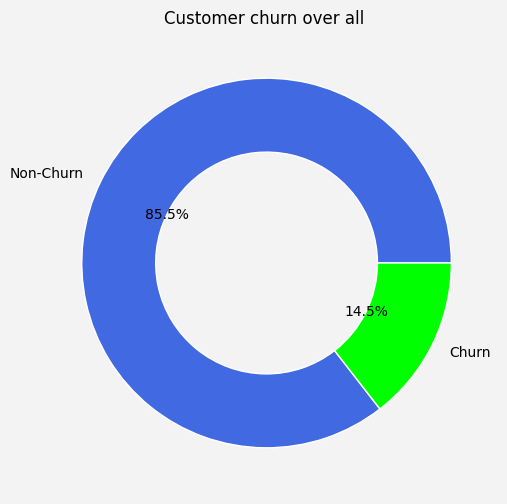

In [7]:

df_combined = pd.concat([df, df_test], axis=0, ignore_index=True)

# Calcul des valeurs de la variable Churn
churn_counts = df_combined['Churn'].value_counts()

# Création du graphique en donut
plt.figure(figsize=(6, 6))
plt.pie(
    churn_counts,
    labels=['Non-Churn', 'Churn'],
    autopct='%1.1f%%',
    colors=['royalblue', 'lime'],
    wedgeprops=dict(width=0.4, edgecolor='white')  # Trou central et bordures blanches
)

# Définir le titre et la couleur d'arrière-plan
plt.title("Customer churn over all ", backgroundcolor="#f3f3f3")
plt.gcf().set_facecolor("#f3f3f3")  # Couleur de fond du graphique

plt.show()


In [8]:
# Sélectionner les variables numériques
numerical_cols = df_combined.select_dtypes(include=['number']).columns.tolist()

# Sélectionner les variables catégorielles
categorical_cols = df_combined.select_dtypes(include=['object', 'category','bool']).columns.tolist()

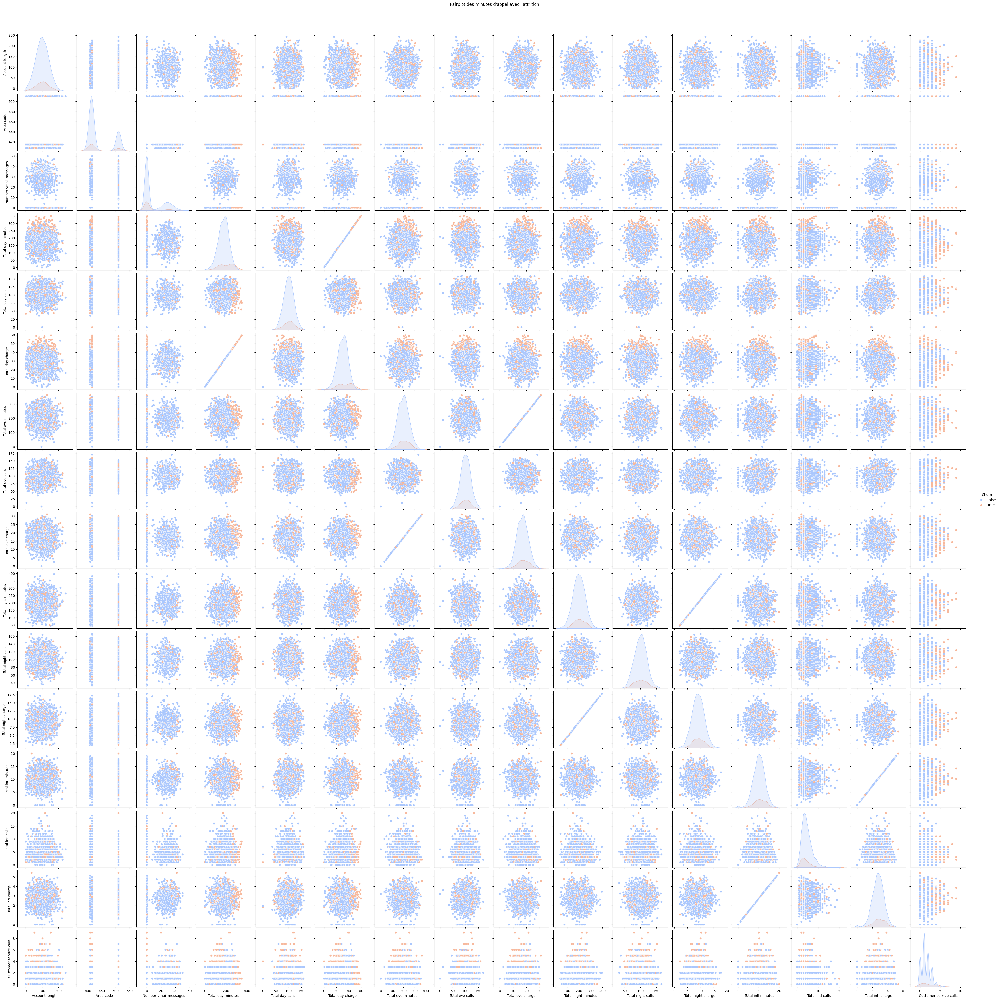

In [9]:
sns.pairplot(df, vars=numerical_cols, hue='Churn', palette='coolwarm')
plt.suptitle("Pairplot des minutes d'appel avec l'attrition", y=1.02)
plt.show()

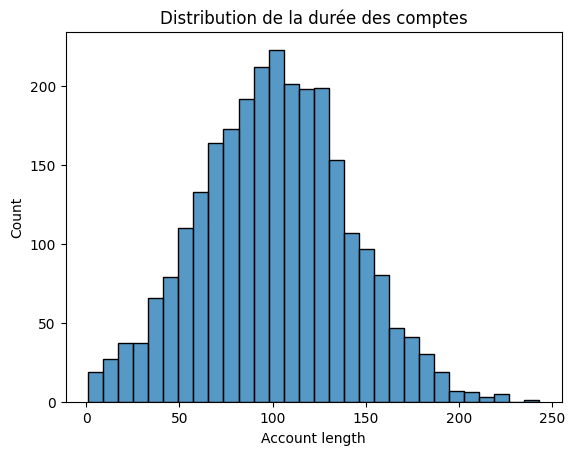

<ipython-input-10-0d5d95e7ddf3>:5: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




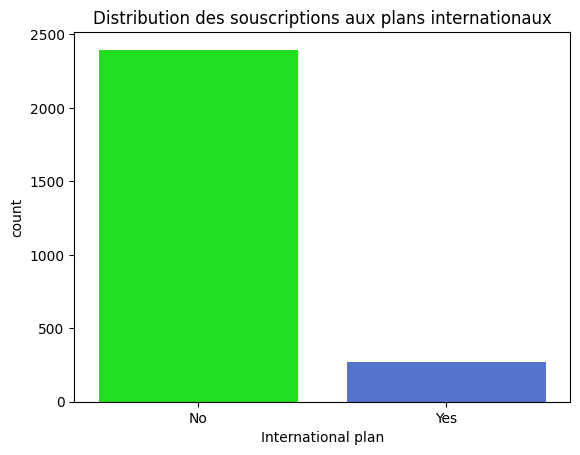

In [10]:
# Distribution de l'âge des comptes
sns.histplot(df['Account length'], bins=30)
plt.title('Distribution de la durée des comptes')
plt.show()
sns.countplot(x='International plan', data=df, palette={'Yes': 'royalblue', 'No': 'lime'})
plt.title("Distribution des souscriptions aux plans internationaux")
plt.show()


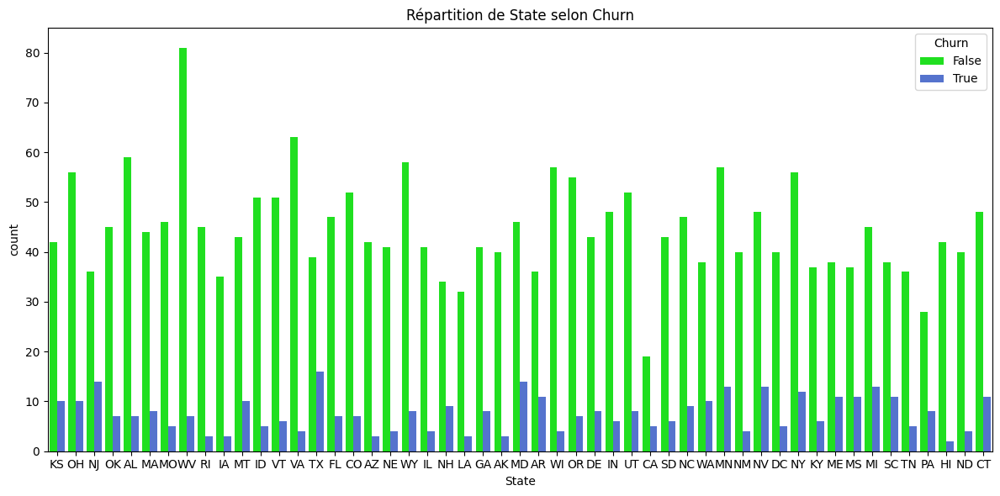

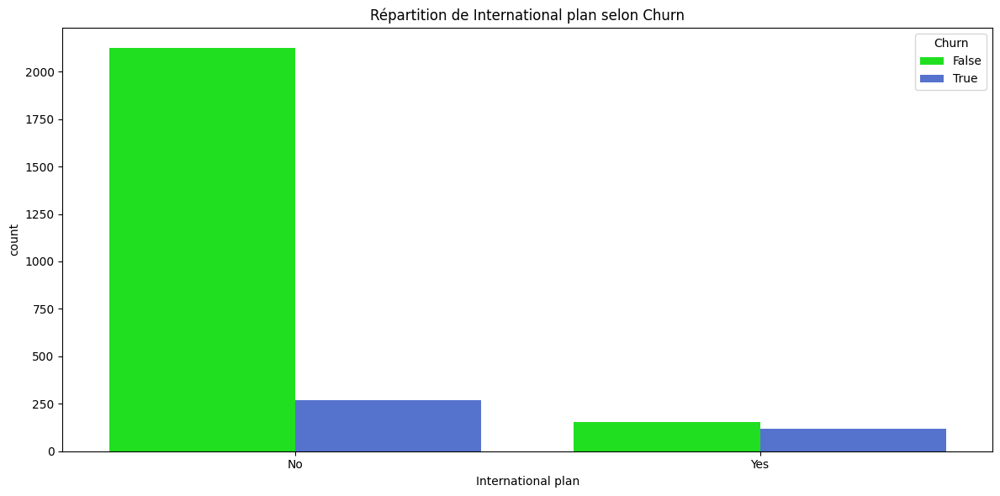

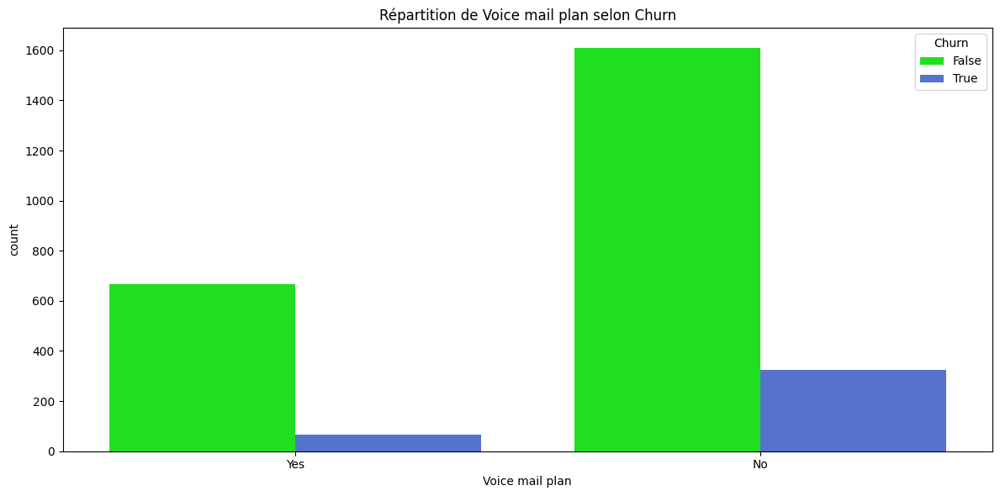

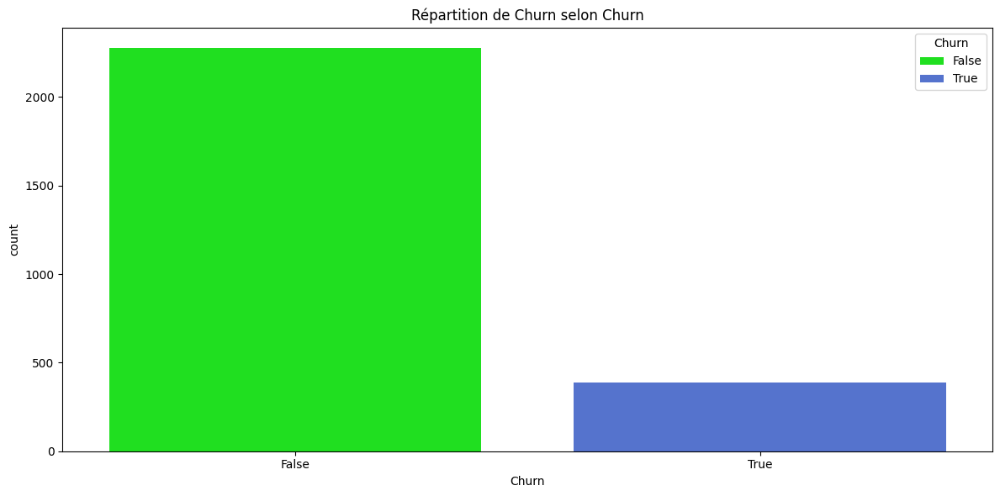

In [11]:
categorical_columns = df.select_dtypes(include=['object', 'bool']).columns
for column in categorical_columns:  # Exclure la dernière colonne
    plt.figure(figsize=(12, 6))  # Augmenter la taille pour plus de lisibilité
    ax = sns.countplot(x=column, hue='Churn', data=df, palette={True: 'royalblue', False: 'lime'})

    # Rotation des étiquettes pour l'axe x si trop de valeurs
    if column == 'state':
        ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha="right")

    plt.title(f"Répartition de {column} selon Churn")
    plt.tight_layout()  # Pour éviter le chevauchement des étiquettes
    plt.show()


If the ratio is greater than 1, it means that the group has a higher churn rate than the average, suggesting that this group is at a higher risk of leaving. If the ratio is less than 1, it means that the group has a lower churn rate than the average, suggesting that this group is less likely to leave

In [12]:
global_mean = df['Churn'].mean()

for feature in categorical_cols :
    df_group=df.groupby(feature).Churn.agg(['mean'])
    df_group['diff']=df_group['mean']-global_mean
    df_group['risk']=df_group['mean']/global_mean
    display(df_group)

,mean,diff,risk
State,,,
AK,0.069767,-0.075769,0.479381
AL,0.106061,-0.039476,0.728757
AR,0.234043,0.088506,1.608138
AZ,0.066667,-0.078870,0.458076
CA,0.208333,0.062797,1.431486
CO,0.118644,-0.026892,0.815219
CT,0.186441,0.040904,1.281059
DC,0.111111,-0.034425,0.763459
DE,0.156863,0.011326,1.077825


,mean,diff,risk
International plan,,,
No,0.112688,-0.032849,0.774293
Yes,0.437037,0.291501,3.002940


,mean,diff,risk
Voice mail plan,,,
No,0.167098,0.021561,1.148151
Yes,0.088677,-0.056860,0.609309


,mean,diff,risk
Churn,,,
False,0.0,-0.145536,0.000000
True,1.0,0.854464,6.871134


<ipython-input-13-6e4f566d5da7>:11: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.


<ipython-input-13-6e4f566d5da7>:11: UserWarning:


The palette list has fewer values (2) than needed (51) and will cycle, which may produce an uninterpretable plot.

<ipython-input-13-6e4f566d5da7>:18: UserWarning:

set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.



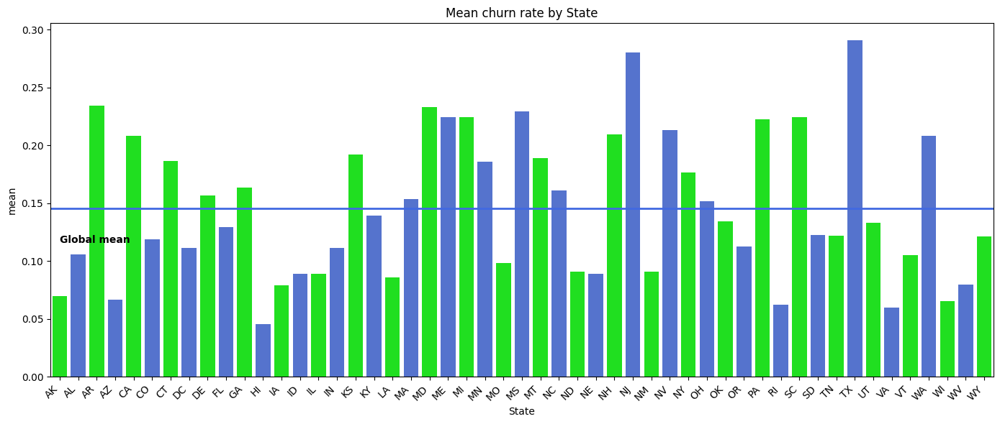

<ipython-input-13-6e4f566d5da7>:11: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.


<ipython-input-13-6e4f566d5da7>:18: UserWarning:

set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.



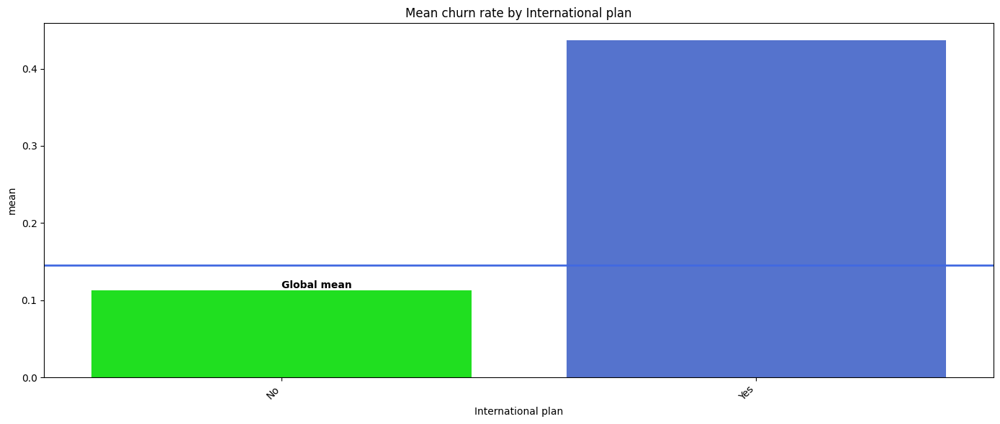

<ipython-input-13-6e4f566d5da7>:11: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.


<ipython-input-13-6e4f566d5da7>:18: UserWarning:

set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.



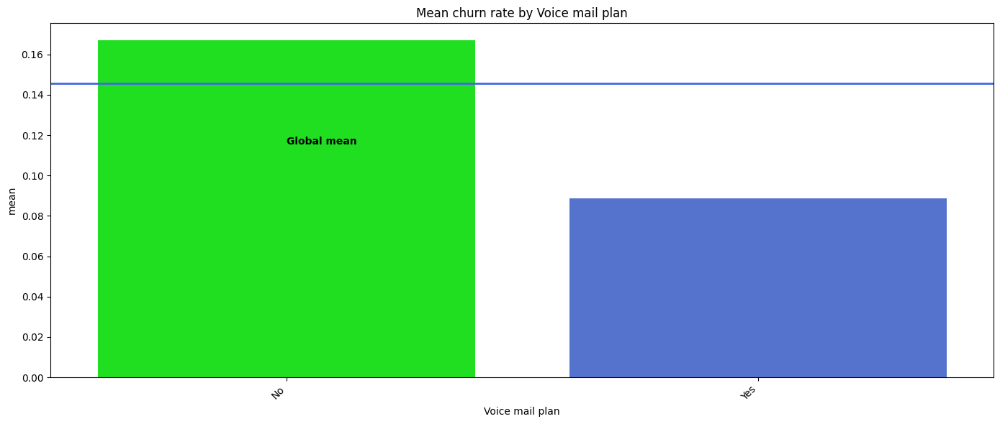

<ipython-input-13-6e4f566d5da7>:11: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.


<ipython-input-13-6e4f566d5da7>:18: UserWarning:

set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.



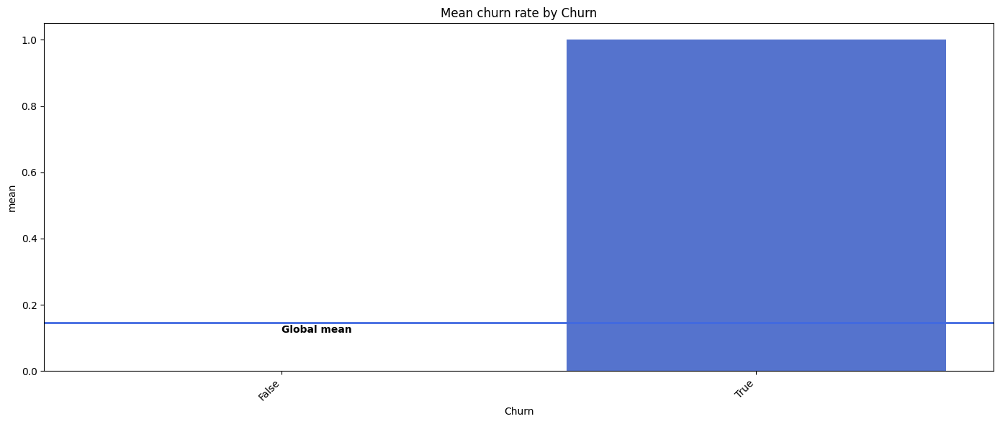

In [13]:
for feature in categorical_cols:
    # Calcul des moyennes pour chaque catégorie
    df_group = df.groupby(feature).Churn.agg(['mean']).reset_index()

    # Limiter les catégories à afficher pour les colonnes contenant de nombreuses valeurs
    if feature == 'state':
        # Affiche seulement les 10 premières valeurs pour éviter l'encombrement
        df_group = df_group.nlargest(10, 'mean')  # Utiliser les top 10 catégories par moyenne de churn

    plt.figure(figsize=(14, 6))  # Agrandir le graphique pour plus de lisibilité
    graph = sns.barplot(x=feature, y='mean', data=df_group, palette=['lime', 'royalblue'])

    # Ligne pour la moyenne globale (bleu)
    graph.axhline(global_mean, linewidth=2, color='royalblue')
    plt.text(0, global_mean - 0.03, "Global mean", color='black', weight='semibold')

    # Rotation des étiquettes pour l'axe x si nécessaire
    graph.set_xticklabels(graph.get_xticklabels(), rotation=45, ha="right")

    plt.title(f"Mean churn rate by {feature}")
    plt.tight_layout()  # Ajustement automatique des marges pour éviter le chevauchement
    plt.show()


#Data Preprocessing

Duplicated Rows

In [14]:

nb_duplicated_rows = df.duplicated().sum()
print("nbr redondantes :")
print(nb_duplicated_rows)

nbr redondantes :
0


In [15]:
duplicated_rows = df_test.duplicated().sum()
print("nbr redondantes :")
print(duplicated_rows)

nbr redondantes :
0


Correlated variables

<ipython-input-16-5b8c829e6033>:4: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.



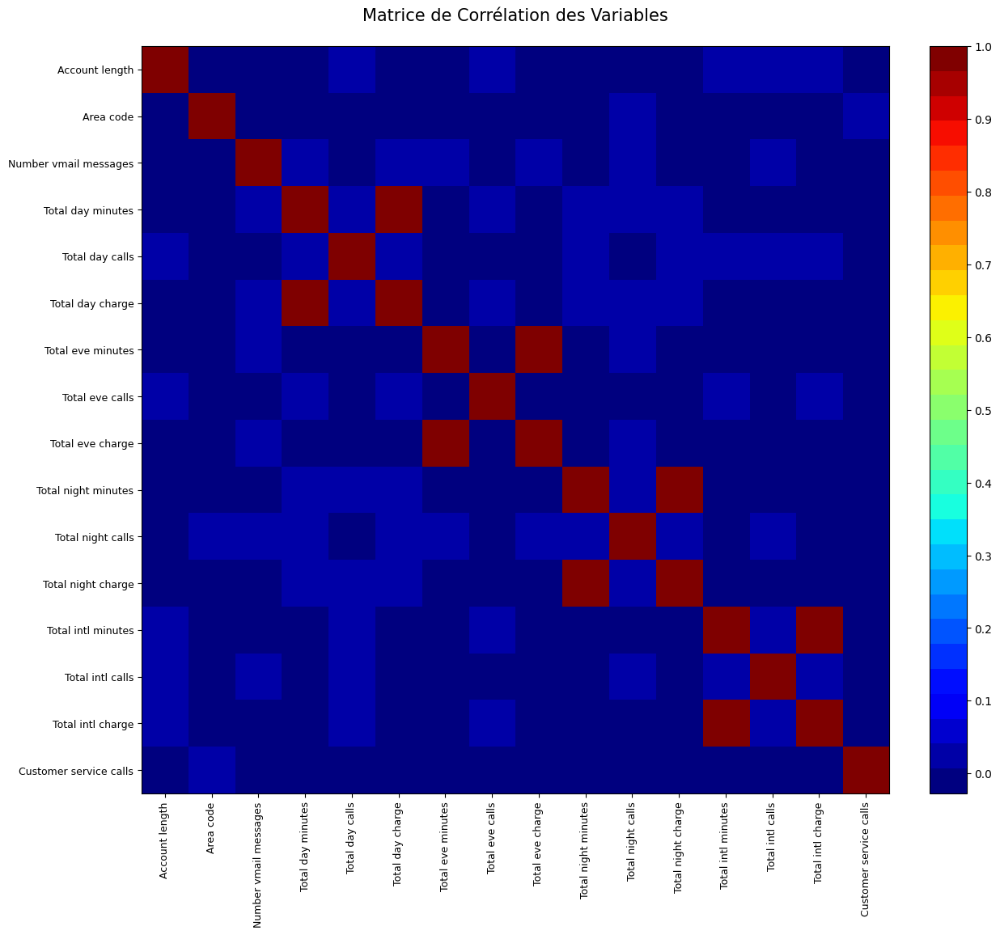

In [16]:


# Définir la fonction pour afficher la matrice de corrélation
def correlation_matrix(df):
    fig, ax = plt.subplots(figsize=(16, 12))
    cmap = cm.get_cmap('jet', 30)

    # Calculer la matrice de corrélation et créer l'image
    cax = ax.imshow(df.corr(), interpolation="nearest", cmap=cmap)
    ax.grid(False)

    # Ajouter des étiquettes et titre
    plt.title('Matrice de Corrélation des Variables\n', fontsize=15)
    labels = df.columns
    ax.set_xticks(range(len(labels)))
    ax.set_yticks(range(len(labels)))
    ax.set_xticklabels(labels, fontsize=9, rotation=90)
    ax.set_yticklabels(labels, fontsize=9)

    # Ajouter la barre de couleur avec des valeurs personnalisées
    fig.colorbar(cax, ticks=[0.1 * i for i in range(-10, 11)], fraction=0.046, pad=0.04)

    plt.show()

# Appel de la fonction sur votre DataFrame
correlation_matrix(df[numerical_cols])


In [17]:


# Sélection des variables caractéristiques
data_characteristics = df[numerical_cols]

# Calcul de la matrice de corrélation
correlation_matrix = data_characteristics.corr()

# Limiter l'affichage des valeurs à 2 décimales pour une meilleure lisibilité
correlation_matrix_rounded = correlation_matrix.round(2)




In [18]:
# Définir un seuil de corrélation pour les corrélations fortes
correlation_threshold = 0.8

# Sélectionner les paires de variables avec une corrélation forte, sans inclure les auto-corrélations (corrélations de 1)
strong_correlations = correlation_matrix[(correlation_matrix.abs() > correlation_threshold) & (correlation_matrix.abs() < 1.0)]

# Transformer la matrice en un format de tableau pour afficher les paires de variables
strong_corr_pairs = strong_correlations.stack().reset_index()
strong_corr_pairs.columns = ["Variable 1", "Variable 2", "Correlation"]
strong_corr_pairs.sort_values(by="Correlation", ascending=False, inplace=True)

# Afficher les paires de variables fortement corrélées
print(strong_corr_pairs)

            Variable 1           Variable 2  Correlation
0    Total day minutes     Total day charge     1.000000
1     Total day charge    Total day minutes     1.000000
2    Total eve minutes     Total eve charge     1.000000
3     Total eve charge    Total eve minutes     1.000000
4  Total night minutes   Total night charge     0.999999
5   Total night charge  Total night minutes     0.999999
6   Total intl minutes    Total intl charge     0.999993
7    Total intl charge   Total intl minutes     0.999993


In [19]:
dff=df.copy()
dff_test=df_test.copy()
dff.drop(['Total day minutes', 'Total eve minutes','Total night minutes','Total intl minutes'], axis=1, inplace=True)
dff_test.drop(['Total day minutes', 'Total eve minutes','Total night minutes','Total intl minutes'], axis=1, inplace=True)


In [20]:
columns_to_remove = ['Total day minutes', 'Total eve minutes', 'Total night minutes', 'Total intl minutes']
numerical_cols = [col for col in numerical_cols if col not in columns_to_remove]

# Afficher les colonnes restantes
print(numerical_cols)
print(len(numerical_cols))

['Account length', 'Area code', 'Number vmail messages', 'Total day calls', 'Total day charge', 'Total eve calls', 'Total eve charge', 'Total night calls', 'Total night charge', 'Total intl calls', 'Total intl charge', 'Customer service calls']
12


outliers

In [21]:
def detect_outliers_iqr_specific(data, column):

    Q1 = data[column].quantile(0.25)
    Q3 = data[column].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR


    outliers = data[(data[column] < lower_bound) | (data[column] > upper_bound)][column]

    return outliers


In [22]:


def afficher_valeurs_aberrantes(data, colonne):
    valeurs_aberrantes = detect_outliers_iqr_specific(data, colonne)

    total_valeurs = len(data[colonne])
    total_aberrantes = len(valeurs_aberrantes)
    pourcentage_aberrantes = (total_aberrantes / total_valeurs) * 100

    bleu_gras = "\033[1m\033[94m"
    reinitialiser_format = "\033[0m"

    print(f"{bleu_gras}Caractéristique : {reinitialiser_format}{colonne}")
    print(f"{bleu_gras}Nombre total de valeurs aberrantes : {reinitialiser_format}{total_aberrantes}")
    print(f"{bleu_gras}Pourcentage de valeurs aberrantes : {reinitialiser_format}{pourcentage_aberrantes:.2f}%")
    print(f"{bleu_gras}Valeurs aberrantes :{reinitialiser_format}\n{valeurs_aberrantes.tolist()}")

    plt.figure(figsize=(18, 6))

    # First plot: Boxplot
    plt.subplot(1, 3, 1)
    sns.boxplot(data=data, x=colonne, color="skyblue")
    plt.title(f"Boxplot des valeurs pour {colonne}")
    plt.xlabel(colonne)

    # Second plot: Histogram
    plt.subplot(1, 3, 2)
    sns.histplot(data[colonne], bins=20, kde=True, color="lightcoral")
    plt.title(f"Histogramme des valeurs pour {colonne}")
    plt.xlabel(colonne)
    plt.ylabel("Fréquence")

    # Third plot: Scatter-Histogram-KDE combo
    plt.subplot(1, 3, 3)
    y = np.arange(len(data[colonne]))  # Creating an index sequence for y-axis

    # Plotting scatter, histogram, and KDE for 2D visualization
    sns.scatterplot(x=data[colonne], y=y, s=5, color=".15")
    sns.histplot(x=data[colonne], y=y, bins=50, pthresh=.1, cmap="mako")
    sns.kdeplot(x=data[colonne], y=y, levels=5, color="lightcoral", linewidths=1)

    plt.title(f"Scatter-Histogram-KDE Plot pour {colonne}")
    plt.xlabel(colonne)
    plt.ylabel("Index")

    plt.tight_layout()
    plt.show()


Account length

Caractéristique : Account length
Nombre total de valeurs aberrantes : 12
Pourcentage de valeurs aberrantes : 0.45%
Valeurs aberrantes :
[209, 224, 243, 210, 212, 225, 225, 224, 212, 210, 217, 221]


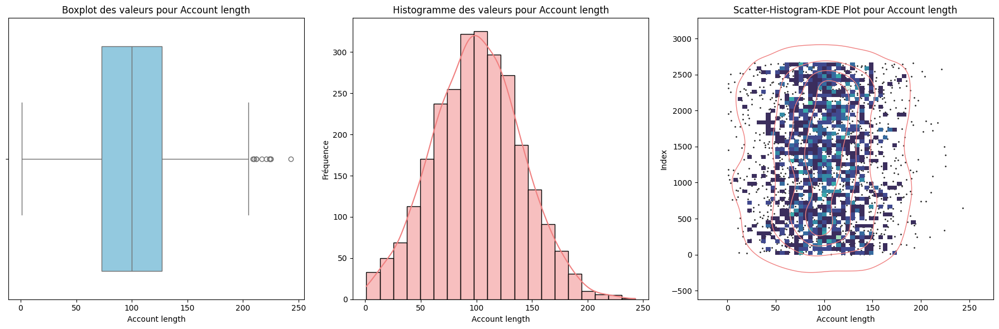

nbr du valeure negative 0
----------------------
Caractéristique : Area code
Nombre total de valeurs aberrantes : 0
Pourcentage de valeurs aberrantes : 0.00%
Valeurs aberrantes :
[]


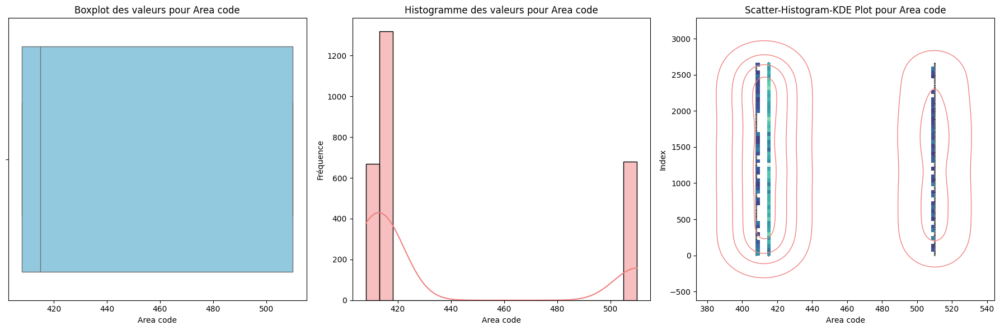

nbr du valeure negative 0
----------------------
Caractéristique : Number vmail messages
Nombre total de valeurs aberrantes : 2
Pourcentage de valeurs aberrantes : 0.08%
Valeurs aberrantes :
[50, 50]


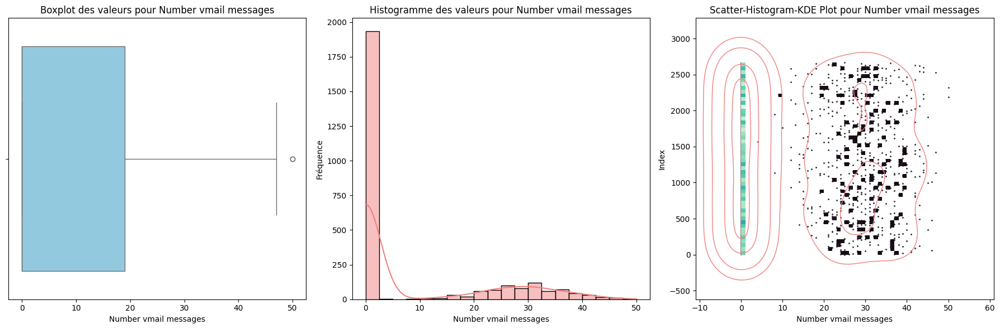

nbr du valeure negative 0
----------------------
Caractéristique : Total day calls
Nombre total de valeurs aberrantes : 18
Pourcentage de valeurs aberrantes : 0.68%
Valeurs aberrantes :
[158, 36, 40, 158, 42, 0, 45, 0, 45, 160, 156, 42, 158, 157, 45, 44, 44, 44]


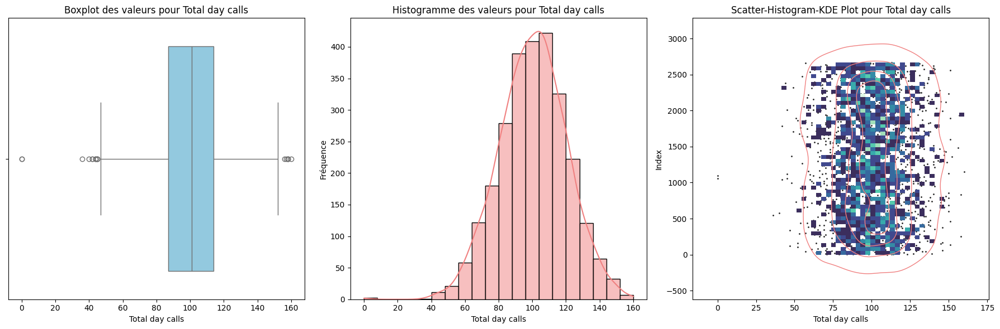

nbr du valeure negative 0
----------------------
Caractéristique : Total day charge
Nombre total de valeurs aberrantes : 21
Pourcentage de valeurs aberrantes : 0.79%
Valeurs aberrantes :
[57.36, 59.64, 57.04, 5.25, 5.78, 58.96, 2.13, 0.0, 0.0, 3.32, 56.07, 1.34, 55.78, 4.59, 2.99, 55.47, 58.7, 0.44, 1.33, 3.21, 5.08]


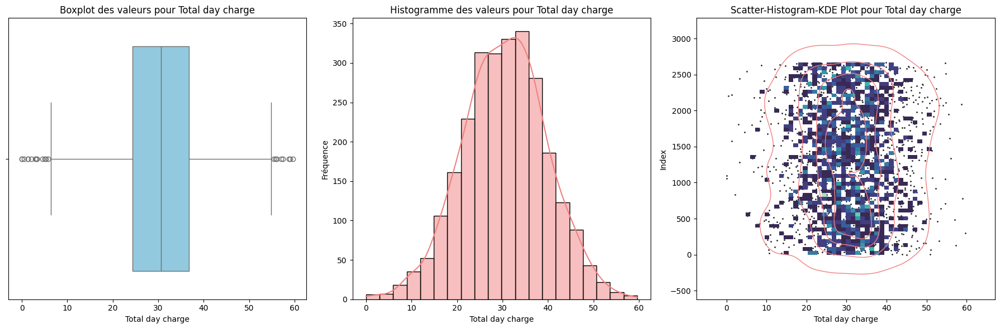

nbr du valeure negative 0
----------------------
Caractéristique : Total eve calls
Nombre total de valeurs aberrantes : 15
Pourcentage de valeurs aberrantes : 0.56%
Valeurs aberrantes :
[46, 42, 12, 157, 45, 36, 156, 46, 44, 155, 43, 0, 155, 159, 170]


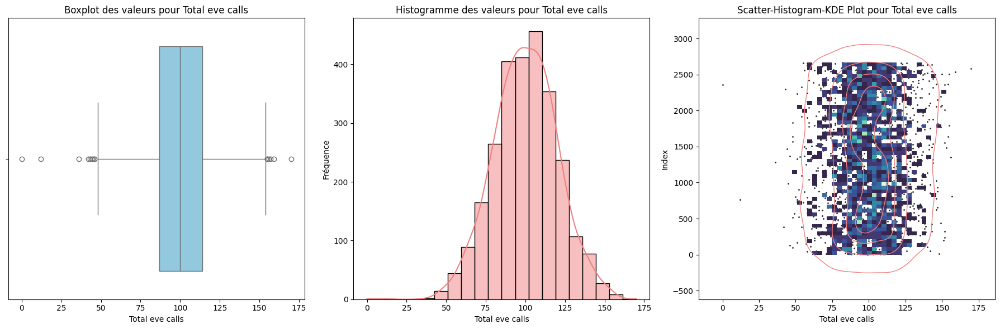

nbr du valeure negative 0
----------------------
Caractéristique : Total eve charge
Nombre total de valeurs aberrantes : 17
Pourcentage de valeurs aberrantes : 0.64%
Valeurs aberrantes :
[29.62, 2.65, 3.59, 29.52, 5.01, 3.73, 4.5, 3.61, 4.98, 4.76, 29.83, 4.18, 28.89, 30.11, 30.91, 0.0, 29.01]


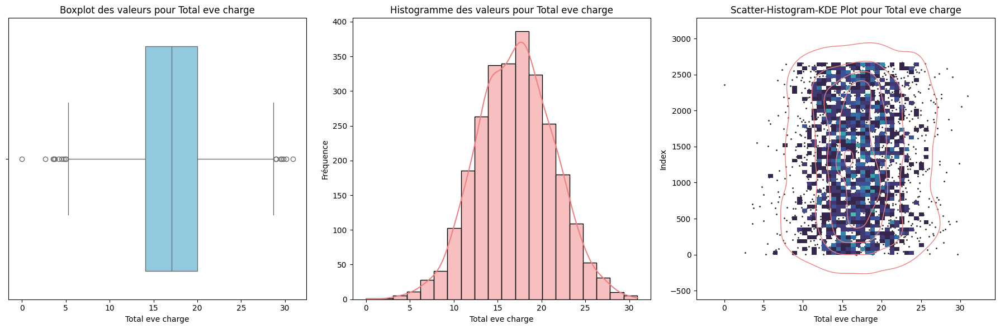

nbr du valeure negative 0
----------------------
Caractéristique : Total night calls
Nombre total de valeurs aberrantes : 19
Pourcentage de valeurs aberrantes : 0.71%
Valeurs aberrantes :
[46, 44, 42, 153, 154, 158, 157, 157, 154, 153, 166, 33, 155, 156, 38, 36, 156, 164, 153]


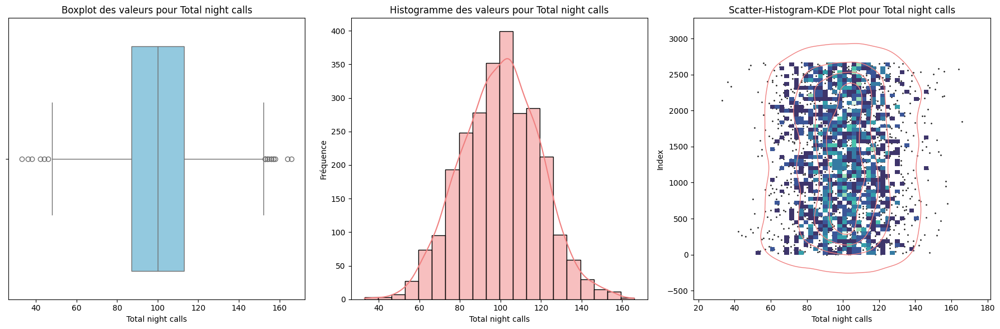

nbr du valeure negative 0
----------------------
Caractéristique : Total night charge
Nombre total de valeurs aberrantes : 22
Pourcentage de valeurs aberrantes : 0.83%
Valeurs aberrantes :
[2.59, 15.97, 15.71, 2.03, 15.43, 16.39, 2.45, 2.25, 1.97, 15.86, 17.19, 16.99, 2.55, 2.43, 15.49, 17.77, 15.76, 2.25, 2.4, 15.85, 16.42, 2.13]


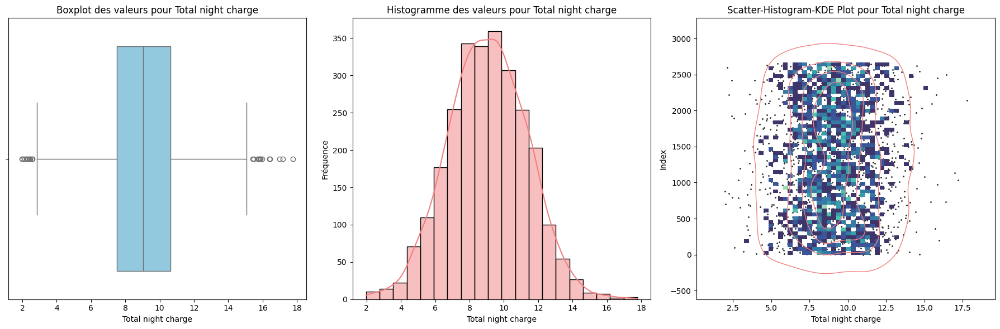

nbr du valeure negative 0
----------------------
Caractéristique : Total intl calls
Nombre total de valeurs aberrantes : 66
Pourcentage de valeurs aberrantes : 2.48%
Valeurs aberrantes :
[19, 15, 11, 12, 13, 11, 12, 11, 13, 12, 11, 11, 18, 11, 13, 12, 12, 13, 11, 11, 14, 13, 11, 13, 12, 11, 14, 15, 18, 13, 11, 14, 11, 14, 15, 12, 11, 16, 11, 11, 11, 11, 11, 14, 11, 12, 13, 11, 11, 16, 13, 13, 11, 15, 11, 12, 13, 12, 12, 12, 11, 13, 11, 13, 20, 17]


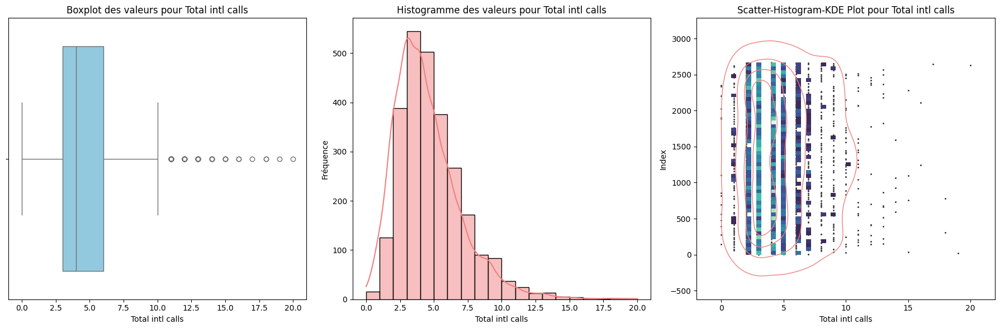

nbr du valeure negative 0
----------------------
Caractéristique : Total intl charge
Nombre total de valeurs aberrantes : 40
Pourcentage de valeurs aberrantes : 1.50%
Valeurs aberrantes :
[5.4, 0.0, 4.75, 5.1, 0.0, 4.86, 0.0, 4.73, 4.73, 4.91, 0.0, 0.0, 0.35, 0.0, 0.0, 0.0, 0.59, 0.0, 4.83, 4.97, 4.81, 0.78, 0.84, 4.75, 0.7, 0.0, 0.0, 4.91, 0.0, 4.86, 0.3, 0.0, 0.0, 0.0, 0.57, 0.78, 4.73, 0.65, 0.68, 4.81]


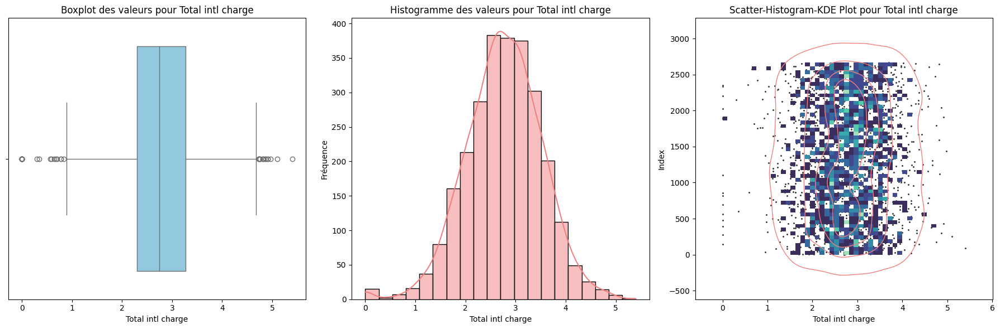

nbr du valeure negative 0
----------------------
Caractéristique : Customer service calls
Nombre total de valeurs aberrantes : 210
Pourcentage de valeurs aberrantes : 7.88%
Valeurs aberrantes :
[4, 5, 5, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 5, 5, 4, 5, 4, 4, 4, 4, 4, 4, 7, 4, 4, 4, 4, 4, 5, 4, 4, 4, 5, 4, 7, 9, 4, 4, 4, 4, 5, 4, 4, 5, 5, 6, 5, 4, 4, 5, 4, 7, 4, 6, 5, 4, 4, 6, 4, 4, 5, 4, 4, 5, 6, 5, 4, 4, 4, 4, 4, 5, 5, 4, 4, 6, 4, 5, 4, 6, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 5, 4, 4, 6, 5, 7, 4, 4, 5, 4, 4, 4, 4, 5, 7, 4, 5, 7, 4, 4, 4, 8, 4, 4, 5, 5, 4, 4, 5, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 5, 6, 4, 4, 5, 5, 4, 6, 4, 4, 4, 9, 6, 4, 5, 5, 6, 4, 4, 4, 5, 5, 6, 4, 4, 4, 5, 4, 4, 4, 5, 4, 5, 6, 4, 4, 5, 4, 4, 4, 5, 4, 4, 4, 5, 5, 6, 7, 5, 5, 4, 6, 4, 4, 4, 5, 6, 7, 4, 4, 5, 5, 4, 4, 5, 6, 5, 4, 4, 4, 4, 4, 4, 4, 4, 5]


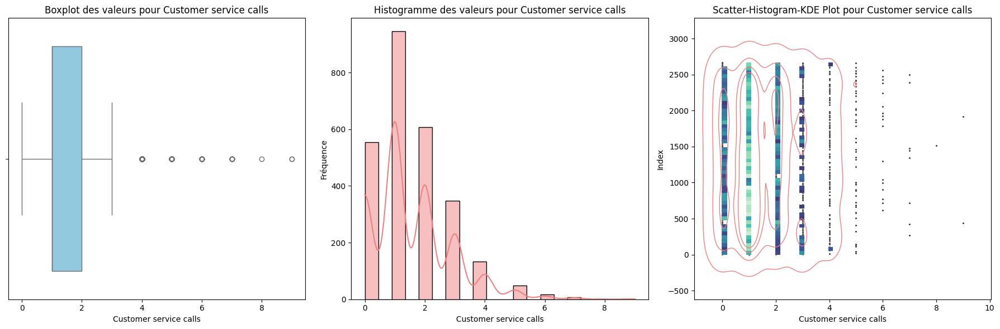

nbr du valeure negative 0
----------------------


In [23]:
for c in numerical_cols:
    afficher_valeurs_aberrantes(dff, c)
    zero_value_count = (dff[c] < 0).sum()
    print("nbr du valeure negative",zero_value_count)
    print("----------------------")

We chose to keep all positive values as they represent critical cases

**Nan values**

train dataset

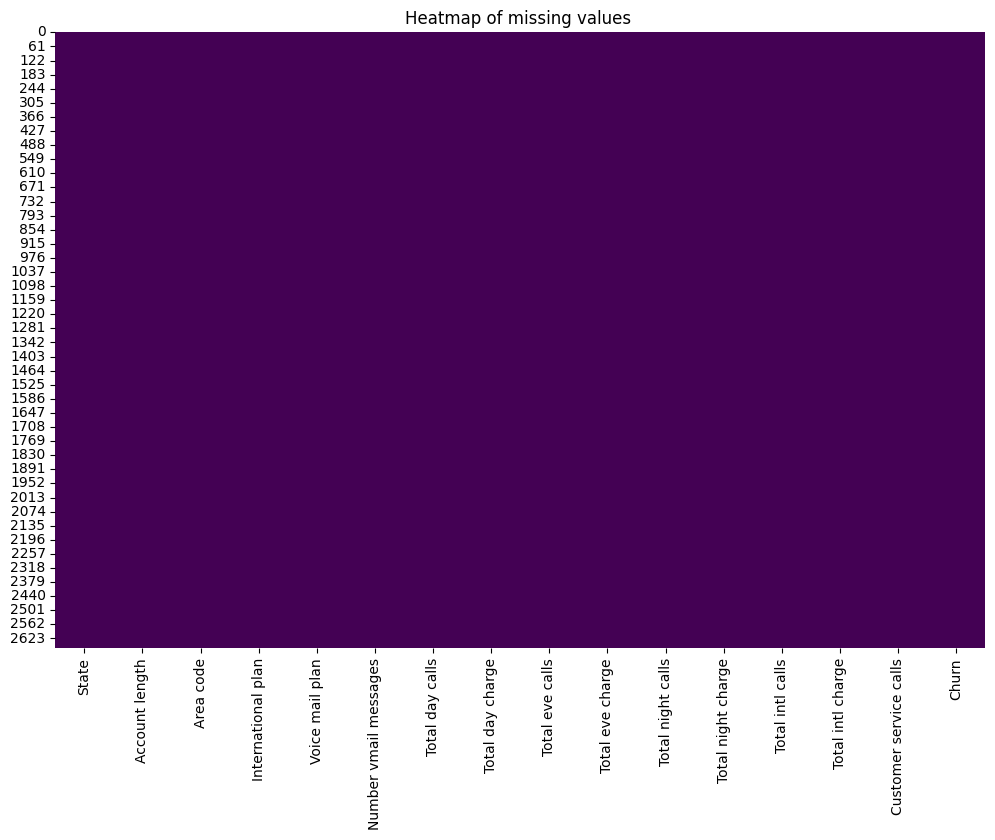

In [24]:
plt.figure(figsize=(12, 8))
sns.heatmap(dff.isnull(), cbar=False, cmap='viridis')
plt.title('Heatmap of missing values ')
plt.show()

In [25]:
dff.isnull().sum()

,0
State,0
Account length,0
Area code,0
International plan,0
Voice mail plan,0
Number vmail messages,0
Total day calls,0
Total day charge,0
Total eve calls,0
Total eve charge,0


test dataset

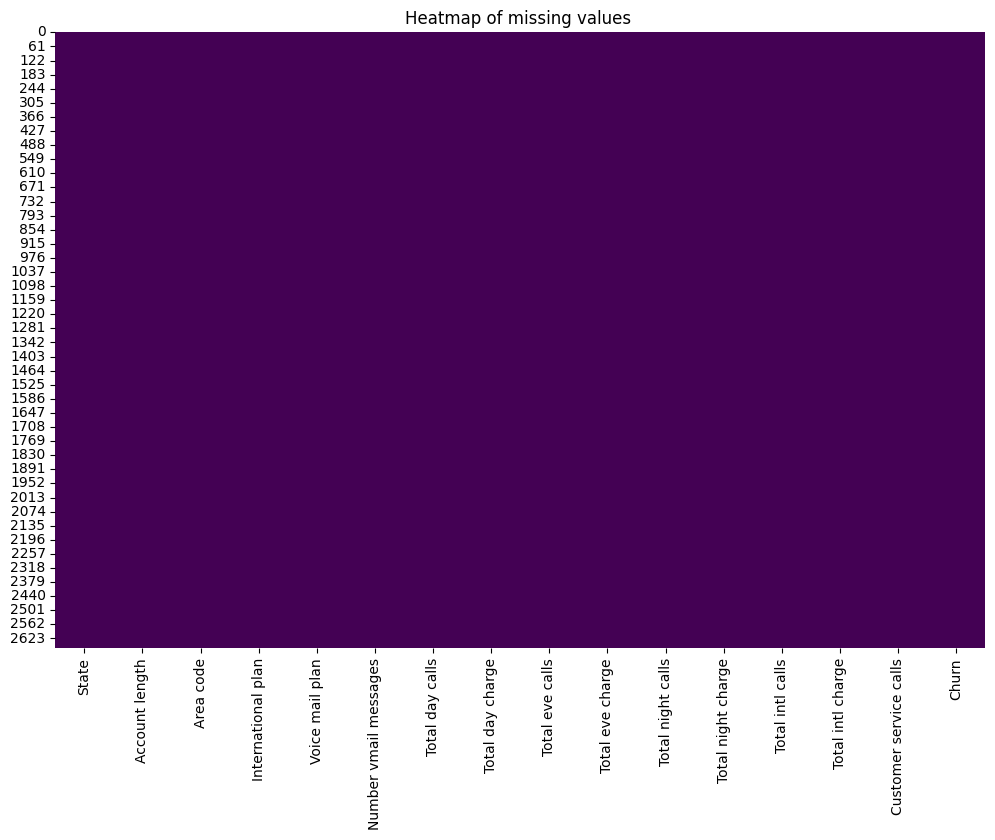

In [26]:
plt.figure(figsize=(12, 8))
sns.heatmap(dff.isnull(), cbar=False, cmap='viridis')
plt.title('Heatmap of missing values ')
plt.show()

In [27]:
dff_test.isnull().sum()

,0
State,0
Account length,0
Area code,0
International plan,0
Voice mail plan,0
Number vmail messages,0
Total day calls,0
Total day charge,0
Total eve calls,0
Total eve charge,0


#Encodage for categorical columns

In [28]:
df_LabelEncoder=dff.copy()
df_LabelEncoder_test=dff_test.copy()

In [29]:
df_oneHoteEncoder=dff.copy()
df_oneHoteEncoder_test=dff_test.copy()

Label encoding for tree-based models

In [30]:

label_encoder = LabelEncoder()
df_before_Labelencoding = dff.copy()
# Encoder chaque colonne catégorielle avec Label Encoding
for col in categorical_cols:
    df_LabelEncoder[col] = label_encoder.fit_transform(df_LabelEncoder[col])


In [31]:
dff.head()

,State,Account length,Area code,International plan,Voice mail plan,Number vmail messages,Total day calls,Total day charge,Total eve calls,Total eve charge,Total night calls,Total night charge,Total intl calls,Total intl charge,Customer service calls,Churn
0,KS,128,415,No,Yes,25,110,45.07,99,16.78,91,11.01,3,2.70,1,False
1,OH,107,415,No,Yes,26,123,27.47,103,16.62,103,11.45,3,3.70,1,False
2,NJ,137,415,No,No,0,114,41.38,110,10.30,104,7.32,5,3.29,0,False
3,OH,84,408,Yes,No,0,71,50.90,88,5.26,89,8.86,7,1.78,2,False
4,OK,75,415,Yes,No,0,113,28.34,122,12.61,121,8.41,3,2.73,3,False


In [32]:
df_LabelEncoder.head()

,State,Account length,Area code,International plan,Voice mail plan,Number vmail messages,Total day calls,Total day charge,Total eve calls,Total eve charge,Total night calls,Total night charge,Total intl calls,Total intl charge,Customer service calls,Churn
0,16,128,415,0,1,25,110,45.07,99,16.78,91,11.01,3,2.70,1,0
1,35,107,415,0,1,26,123,27.47,103,16.62,103,11.45,3,3.70,1,0
2,31,137,415,0,0,0,114,41.38,110,10.30,104,7.32,5,3.29,0,0
3,35,84,408,1,0,0,71,50.90,88,5.26,89,8.86,7,1.78,2,0
4,36,75,415,1,0,0,113,28.34,122,12.61,121,8.41,3,2.73,3,0


In [33]:
print(categorical_cols)

['State', 'International plan', 'Voice mail plan', 'Churn']


In [34]:


# Initialiser les DataFrames de référence pour chaque variable encodée
df_after_Labelencoding = df_LabelEncoder.copy()

state_reference = pd.DataFrame({
    'State': df_before_Labelencoding['State'],
    'State_Code': df_after_Labelencoding['State']
}).drop_duplicates().reset_index(drop=True)

churn_code_reference = pd.DataFrame({
    'Churn': df_before_Labelencoding['Churn'],
    'Churn_Code': df_after_Labelencoding['Churn']
}).drop_duplicates().reset_index(drop=True)

international_plan_reference = pd.DataFrame({
    'International plan': df_before_Labelencoding['International plan'],
    'International plan_Code': df_after_Labelencoding['International plan']
}).drop_duplicates().reset_index(drop=True)

voice_mail_plan_reference = pd.DataFrame({
    'Voice mail plan': df_before_Labelencoding['Voice mail plan'],
    'Voice mail plan_Code': df_after_Labelencoding['Voice mail plan']
}).drop_duplicates().reset_index(drop=True)
print(churn_code_reference)
print(state_reference)
print(international_plan_reference)
print(voice_mail_plan_reference)
print("Les DataFrames de référence ont été créés et sauvegardés avec succès.")

# Exporter les DataFrames en fichiers CSV
churn_code_reference.to_csv('churn_code_reference.csv', index=False)
state_reference.to_csv('state_reference.csv', index=False)
international_plan_reference.to_csv('international_plan_reference.csv', index=False)
voice_mail_plan_reference.to_csv('voice_mail_plan_reference.csv', index=False)

print("Les DataFrames de référence ont été créés et sauvegardés avec succès.")


   Churn  Churn_Code
0  False           0
1   True           1
   State  State_Code
0     KS          16
1     OH          35
2     NJ          31
3     OK          36
4     AL           1
5     MA          19
6     MO          24
7     WV          49
8     RI          39
9     IA          12
10    MT          26
11    ID          13
12    VT          46
13    VA          45
14    TX          43
15    FL           9
16    CO           5
17    AZ           3
18    NE          29
19    WY          50
20    IL          14
21    NH          30
22    LA          18
23    GA          10
24    AK           0
25    MD          20
26    AR           2
27    WI          48
28    OR          37
29    DE           8
30    IN          15
31    UT          44
32    CA           4
33    SD          41
34    NC          27
35    WA          47
36    MN          23
37    NM          32
38    NV          33
39    DC           7
40    NY          34
41    KY          17
42    ME          21
43    MS     

In [35]:




# Créer des mappings pour les colonnes catégorielles
state_mapping = dict(zip(state_reference['State'], state_reference['State_Code']))
international_plan_mapping = dict(zip(international_plan_reference['International plan'], international_plan_reference['International plan_Code']))
voice_mail_plan_mapping = dict(zip(voice_mail_plan_reference['Voice mail plan'], voice_mail_plan_reference['Voice mail plan_Code']))
churn_mapping = dict(zip(churn_code_reference['Churn'], churn_code_reference['Churn_Code']))
# Remplacer les valeurs catégorielles dans dff_test par les codes correspondants
df_LabelEncoder_test['State'] = df_LabelEncoder_test['State'].map(state_mapping)
df_LabelEncoder_test['International plan'] = df_LabelEncoder_test['International plan'].map(international_plan_mapping)
df_LabelEncoder_test['Voice mail plan'] = df_LabelEncoder_test['Voice mail plan'].map(voice_mail_plan_mapping)
df_LabelEncoder_test['Churn'] = df_LabelEncoder_test['Churn'].map(churn_mapping)
# Vérifier les modifications
dff_test.head()


,State,Account length,Area code,International plan,Voice mail plan,Number vmail messages,Total day calls,Total day charge,Total eve calls,Total eve charge,Total night calls,Total night charge,Total intl calls,Total intl charge,Customer service calls,Churn
0,LA,117,408,No,No,0,97,31.37,80,29.89,90,9.71,4,2.35,1,False
1,IN,65,415,No,No,0,137,21.95,83,19.42,111,9.40,6,3.43,4,True
2,NY,161,415,No,No,0,67,56.59,97,27.01,128,7.23,9,1.46,4,True
3,SC,111,415,No,No,0,103,18.77,102,11.67,105,8.53,6,2.08,2,False
4,HI,49,510,No,No,0,117,20.28,109,18.28,90,8.04,1,3.00,1,False


In [36]:
df_LabelEncoder_test.head()


,State,Account length,Area code,International plan,Voice mail plan,Number vmail messages,Total day calls,Total day charge,Total eve calls,Total eve charge,Total night calls,Total night charge,Total intl calls,Total intl charge,Customer service calls,Churn
0,18,117,408,0,0,0,97,31.37,80,29.89,90,9.71,4,2.35,1,0
1,15,65,415,0,0,0,137,21.95,83,19.42,111,9.40,6,3.43,4,1
2,34,161,415,0,0,0,67,56.59,97,27.01,128,7.23,9,1.46,4,1
3,40,111,415,0,0,0,103,18.77,102,11.67,105,8.53,6,2.08,2,0
4,11,49,510,0,0,0,117,20.28,109,18.28,90,8.04,1,3.00,1,0


In [37]:
pd.set_option('display.max_columns', None)

In [38]:

dfcox=df_LabelEncoder.copy()

one hote encoding pour regression logistique svm et GBM

In [39]:
df_oneHoteEncoder=dff.copy()
df_oneHoteEncoder_test=dff_test.copy()
# Créer des mappings pour les colonnes catégorielles
international_plan_mapping = dict(zip(international_plan_reference['International plan'], international_plan_reference['International plan_Code']))
voice_mail_plan_mapping = dict(zip(voice_mail_plan_reference['Voice mail plan'], voice_mail_plan_reference['Voice mail plan_Code']))
churn_mapping = dict(zip(churn_code_reference['Churn'], churn_code_reference['Churn_Code']))
# Remplacer les valeurs catégorielles dans dff_test par les codes correspondants

df_oneHoteEncoder['International plan'] = df_oneHoteEncoder['International plan'].map(international_plan_mapping)
df_oneHoteEncoder['Voice mail plan'] = df_oneHoteEncoder['Voice mail plan'].map(voice_mail_plan_mapping)
df_oneHoteEncoder['Churn'] = df_oneHoteEncoder['Churn'].map(churn_mapping)

df_oneHoteEncoder_test['International plan'] = df_oneHoteEncoder_test['International plan'].map(international_plan_mapping)
df_oneHoteEncoder_test['Voice mail plan'] = df_oneHoteEncoder_test['Voice mail plan'].map(voice_mail_plan_mapping)
df_oneHoteEncoder_test['Churn'] = df_oneHoteEncoder_test['Churn'].map(churn_mapping)

df_oneHoteEncoder

,State,Account length,Area code,International plan,Voice mail plan,Number vmail messages,Total day calls,Total day charge,Total eve calls,Total eve charge,Total night calls,Total night charge,Total intl calls,Total intl charge,Customer service calls,Churn
0,KS,128,415,0,1,25,110,45.07,99,16.78,91,11.01,3,2.70,1,0
1,OH,107,415,0,1,26,123,27.47,103,16.62,103,11.45,3,3.70,1,0
2,NJ,137,415,0,0,0,114,41.38,110,10.30,104,7.32,5,3.29,0,0
3,OH,84,408,1,0,0,71,50.90,88,5.26,89,8.86,7,1.78,2,0
4,OK,75,415,1,0,0,113,28.34,122,12.61,121,8.41,3,2.73,3,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2661,SC,79,415,0,0,0,98,22.90,68,16.12,128,9.96,5,3.19,2,0
2662,AZ,192,415,0,1,36,77,26.55,126,18.32,83,12.56,6,2.67,2,0
2663,WV,68,415,0,0,0,57,39.29,55,13.04,123,8.61,4,2.59,3,0
2664,RI,28,510,0,0,0,109,30.74,58,24.55,91,8.64,6,3.81,2,0


In [40]:
from sklearn.preprocessing import OneHotEncoder
import pandas as pd

# Vérifiez les colonnes disponibles
print(df_oneHoteEncoder.columns)

# Colonne cible pour l'encodage
target_column = "State"

# Copier le DataFrame d'origine
df_before_OneHotEncoding = dff.copy()
onehot_encoder = OneHotEncoder(sparse_output=False, drop=None)

# Initialiser un DataFrame pour stocker le résultat final (colonnes non catégorielles)
df_OneHotEncoded = df_oneHoteEncoder.drop(columns=[target_column])  # Garder les colonnes autres que `State`

# Appliquer One-Hot Encoding à la colonne `State`
encoded_array = onehot_encoder.fit_transform(df_oneHoteEncoder[[target_column]])

# Récupérer les noms des nouvelles colonnes encodées
encoded_col_names = onehot_encoder.get_feature_names_out([target_column])

# Convertir les données encodées en DataFrame
encoded_df = pd.DataFrame(encoded_array, columns=encoded_col_names)

# Ajouter les colonnes encodées au DataFrame final
df_OneHotEncoded = pd.concat([df_OneHotEncoded, encoded_df], axis=1)

# Créer un DataFrame de référence pour la colonne `State`
unique_values = df_before_OneHotEncoding[[target_column]].drop_duplicates().reset_index(drop=True)
reference_df = pd.DataFrame(encoded_array[:len(unique_values)], columns=encoded_col_names)
reference_df.insert(0, target_column, unique_values[target_column])

# Afficher le DataFrame encodé et la référence
print("DataFrame encodé avec One-Hot Encoding (uniquement pour `State`) :")
df_OneHotEncoded

Index(['State', 'Account length', 'Area code', 'International plan',
       'Voice mail plan', 'Number vmail messages', 'Total day calls',
       'Total day charge', 'Total eve calls', 'Total eve charge',
       'Total night calls', 'Total night charge', 'Total intl calls',
       'Total intl charge', 'Customer service calls', 'Churn'],
      dtype='object')
DataFrame encodé avec One-Hot Encoding (uniquement pour `State`) :


,Account length,Area code,International plan,Voice mail plan,Number vmail messages,Total day calls,Total day charge,Total eve calls,Total eve charge,Total night calls,Total night charge,Total intl calls,Total intl charge,Customer service calls,Churn,State_AK,State_AL,State_AR,State_AZ,State_CA,State_CO,State_CT,State_DC,State_DE,State_FL,State_GA,State_HI,State_IA,State_ID,State_IL,State_IN,State_KS,State_KY,State_LA,State_MA,State_MD,State_ME,State_MI,State_MN,State_MO,State_MS,State_MT,State_NC,State_ND,State_NE,State_NH,State_NJ,State_NM,State_NV,State_NY,State_OH,State_OK,State_OR,State_PA,State_RI,State_SC,State_SD,State_TN,State_TX,State_UT,State_VA,State_VT,State_WA,State_WI,State_WV,State_WY
0,128,415,0,1,25,110,45.07,99,16.78,91,11.01,3,2.70,1,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,107,415,0,1,26,123,27.47,103,16.62,103,11.45,3,3.70,1,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,137,415,0,0,0,114,41.38,110,10.30,104,7.32,5,3.29,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,84,408,1,0,0,71,50.90,88,5.26,89,8.86,7,1.78,2,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,75,415,1,0,0,113,28.34,122,12.61,121,8.41,3,2.73,3,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2661,79,415,0,0,0,98,22.90,68,16.12,128,9.96,5,3.19,2,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2662,192,415,0,1,36,77,26.55,126,18.32,83,12.56,6,2.67,2,0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2663,68,415,0,0,0,57,39.29,55,13.04,123,8.61,4,2.59,3,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
2664,28,510,0,0,0,109,30.74,58,24.55,91,8.64,6,3.81,2,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [41]:
from sklearn.preprocessing import OneHotEncoder
import pandas as pd

# Initialize the OneHotEncoder
encoder = OneHotEncoder(sparse_output=False, drop=None)  # sparse_output=False for dense array

# Fit and transform the 'State' column
state_encoded = encoder.fit_transform(df_oneHoteEncoder_test[['State']])

# Get the names of the encoded columns
state_encoded_columns = encoder.get_feature_names_out(['State'])

# Create a DataFrame with the encoded columns
state_encoded_df = pd.DataFrame(state_encoded, columns=state_encoded_columns, index=df_oneHoteEncoder_test.index)

# Concatenate the encoded columns to the original DataFrame (keeping the original columns intact)
df_oneHoteEncoder_test = pd.concat([df_oneHoteEncoder_test, state_encoded_df], axis=1)

# Drop the original 'State' column
df_oneHoteEncoder_test.drop('State', axis=1, inplace=True)

# Now, reorder the new columns according to the order in reference_df.columns[1:]
# Ensure that we only reorder the newly created columns (the ones added by one-hot encoding)
new_columns = state_encoded_columns.tolist()

# Create a list of the original columns (without 'State') and the new columns
original_columns = [col for col in df_oneHoteEncoder_test.columns if col not in new_columns]
final_column_order = original_columns + new_columns

# Reorder the columns in df_oneHoteEncoder_test
df_oneHoteEncoder_test = df_oneHoteEncoder_test[final_column_order]

# Display the final DataFrame
df_oneHoteEncoder_test


,Account length,Area code,International plan,Voice mail plan,Number vmail messages,Total day calls,Total day charge,Total eve calls,Total eve charge,Total night calls,Total night charge,Total intl calls,Total intl charge,Customer service calls,Churn,State_AK,State_AL,State_AR,State_AZ,State_CA,State_CO,State_CT,State_DC,State_DE,State_FL,State_GA,State_HI,State_IA,State_ID,State_IL,State_IN,State_KS,State_KY,State_LA,State_MA,State_MD,State_ME,State_MI,State_MN,State_MO,State_MS,State_MT,State_NC,State_ND,State_NE,State_NH,State_NJ,State_NM,State_NV,State_NY,State_OH,State_OK,State_OR,State_PA,State_RI,State_SC,State_SD,State_TN,State_TX,State_UT,State_VA,State_VT,State_WA,State_WI,State_WV,State_WY
0,117,408,0,0,0,97,31.37,80,29.89,90,9.71,4,2.35,1,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,65,415,0,0,0,137,21.95,83,19.42,111,9.40,6,3.43,4,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,161,415,0,0,0,67,56.59,97,27.01,128,7.23,9,1.46,4,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,111,415,0,0,0,103,18.77,102,11.67,105,8.53,6,2.08,2,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,49,510,0,0,0,117,20.28,109,18.28,90,8.04,1,3.00,1,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
662,114,415,0,1,26,88,23.31,125,13.23,94,11.14,7,3.11,2,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
663,106,408,0,1,29,131,14.21,131,17.33,73,10.33,3,2.19,1,0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
664,60,415,0,0,0,118,32.96,110,7.23,134,9.45,8,3.56,3,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
665,159,415,0,0,0,114,28.87,105,16.80,82,8.72,4,3.13,1,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0


In [42]:
#oneHote encoding for State
df_oneHoteEncoder_test
df_OneHotEncoded
#Label encoder
df_LabelEncoder_test
df_LabelEncoder

,State,Account length,Area code,International plan,Voice mail plan,Number vmail messages,Total day calls,Total day charge,Total eve calls,Total eve charge,Total night calls,Total night charge,Total intl calls,Total intl charge,Customer service calls,Churn
0,16,128,415,0,1,25,110,45.07,99,16.78,91,11.01,3,2.70,1,0
1,35,107,415,0,1,26,123,27.47,103,16.62,103,11.45,3,3.70,1,0
2,31,137,415,0,0,0,114,41.38,110,10.30,104,7.32,5,3.29,0,0
3,35,84,408,1,0,0,71,50.90,88,5.26,89,8.86,7,1.78,2,0
4,36,75,415,1,0,0,113,28.34,122,12.61,121,8.41,3,2.73,3,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2661,40,79,415,0,0,0,98,22.90,68,16.12,128,9.96,5,3.19,2,0
2662,3,192,415,0,1,36,77,26.55,126,18.32,83,12.56,6,2.67,2,0
2663,49,68,415,0,0,0,57,39.29,55,13.04,123,8.61,4,2.59,3,0
2664,39,28,510,0,0,0,109,30.74,58,24.55,91,8.64,6,3.81,2,0


#Standarisation

In [43]:

scaler=MinMaxScaler()
X_scaled =scaler.fit_transform(df_LabelEncoder[numerical_cols])
joblib.dump(scaler, 'minmax_scaler.pkl')
X_scaled_test = scaler.fit_transform(df_LabelEncoder_test[numerical_cols])
df_LabelEncoder[numerical_cols]=X_scaled
df_LabelEncoder_test[numerical_cols]=X_scaled_test

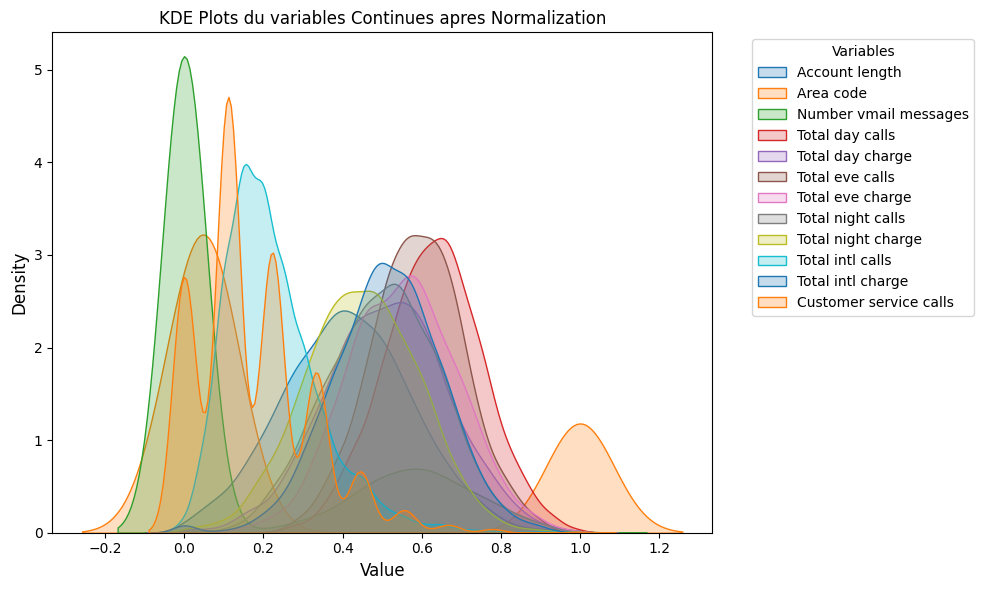

In [44]:
# Increase figure size for better visibility
plt.figure(figsize=(10, 6))


# Loop through continuous variables to plot their KDEs
for var in numerical_cols:
    sns.kdeplot(df_LabelEncoder[var], fill=True, label=var, linewidth=1)

# Title and legend
plt.title('KDE Plots du variables Continues apres Normalization', fontsize=12)
plt.xlabel('Value', fontsize=12)
plt.ylabel('Density', fontsize=12)
plt.legend(title='Variables', bbox_to_anchor=(1.05, 1), loc='upper left')  # Place legend outside
plt.tight_layout()

# Show plot
plt.show()

In [45]:
df_LabelEncoder.head()

,State,Account length,Area code,International plan,Voice mail plan,Number vmail messages,Total day calls,Total day charge,Total eve calls,Total eve charge,Total night calls,Total night charge,Total intl calls,Total intl charge,Customer service calls,Churn
0,16,0.524793,0.068627,0,1,0.50,0.68750,0.755701,0.582353,0.542866,0.436090,0.572152,0.15,0.500000,0.111111,0
1,35,0.438017,0.068627,0,1,0.52,0.76875,0.460597,0.605882,0.537690,0.526316,0.600000,0.15,0.685185,0.111111,0
2,31,0.561983,0.068627,0,0,0.00,0.71250,0.693830,0.647059,0.333225,0.533835,0.338608,0.25,0.609259,0.000000,0
3,35,0.342975,0.000000,1,0,0.00,0.44375,0.853454,0.517647,0.170171,0.421053,0.436076,0.35,0.329630,0.222222,0
4,36,0.305785,0.068627,1,0,0.00,0.70625,0.475184,0.717647,0.407959,0.661654,0.407595,0.15,0.505556,0.333333,0


In [46]:
df_LabelEncoder_test.head()

,State,Account length,Area code,International plan,Voice mail plan,Number vmail messages,Total day calls,Total day charge,Total eve calls,Total eve charge,Total night calls,Total night charge,Total intl calls,Total intl charge,Customer service calls,Churn
0,18,0.502165,0.000000,0,0,0.0,0.496296,0.514400,0.328244,0.967742,0.360902,0.558994,0.222222,0.475709,0.125,0
1,15,0.277056,0.068627,0,0,0.0,0.792593,0.334732,0.351145,0.575019,0.518797,0.539007,0.333333,0.694332,0.500,1
2,34,0.692641,0.068627,0,0,0.0,0.274074,0.995422,0.458015,0.859715,0.646617,0.399097,0.500000,0.295547,0.500,1
3,40,0.476190,0.068627,0,0,0.0,0.540741,0.274080,0.496183,0.284321,0.473684,0.482914,0.333333,0.421053,0.250,0
4,11,0.207792,1.000000,0,0,0.0,0.644444,0.302880,0.549618,0.532258,0.360902,0.451322,0.055556,0.607287,0.125,0


#Data split

In [47]:
X_train_arbre=df_LabelEncoder.drop('Churn', axis=1)
y_train_arbre=df_LabelEncoder['Churn']
X_test_arbre=df_LabelEncoder_test.drop('Churn', axis=1)
y_test_arbre=df_LabelEncoder_test['Churn']


In [48]:
X_train_lin=df_OneHotEncoded.drop('Churn', axis=1)
y_train_lin=df_OneHotEncoded['Churn']
X_test_lin=df_oneHoteEncoder_test.drop('Churn', axis=1)
y_test_lin=df_oneHoteEncoder_test['Churn']

#up-sampling

In [49]:
df_combined_arbre = pd.concat([df_LabelEncoder, df_LabelEncoder_test], axis=0, ignore_index=True)
count_cible = df_combined_arbre['Churn'].value_counts()
count_cible

,count
Churn,
0,2850
1,483


In [50]:
pip install imbalanced-learn

In [51]:



# Charger les données
X = df_combined_arbre.drop(columns=['Churn'])
y = df_combined_arbre['Churn']

# Diviser en ensembles d'entraînement et de test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

# Appliquer SMOTE pour équilibrer la classe minoritaire
smote = SMOTE(sampling_strategy='minority', random_state=42)
enn = EditedNearestNeighbours(n_neighbors=11)

# Appliquer SMOTE une première fois
X_res, y_res = smote.fit_resample(X_train, y_train)

# Appliquer ENN et nettoyer les données après SMOTE
X_res, y_res = enn.fit_resample(X_res, y_res)

# Vérifier la répartition des classes après le premier nettoyage
class_distribution = Counter(y_res)
print(f"Répartition des classes après SMOTE + ENN (1ère itération) : {class_distribution}")


while min(class_distribution.values()) != max(class_distribution.values()):
    # Réappliquer SMOTE sur les données nettoyées après ENN pour compléter les classes
    X_res, y_res = smote.fit_resample(X_res, y_res)

    # Appliquer ENN pour nettoyer encore
    X_res, y_res = enn.fit_resample(X_res, y_res)

    # Vérifier la répartition des classes après chaque itération
    class_distribution = Counter(y_res)
    print(f"Répartition des classes après itération de SMOTE + ENN : {class_distribution}")
    # Supprimer les doublons après chaque itération
    X_res, y_res = pd.DataFrame(X_res).drop_duplicates(), y_res[X_res.duplicated() == False]

# Créer une DataFrame équilibrée avec les données résultantes
df_balanced_arbre = pd.DataFrame(X_res, columns=X.columns)
df_balanced_arbre['Churn'] = y_res

# Vérifier la répartition finale des classes
print("Répartition des classes après SMOTE + ENN final :")
print(df_balanced_arbre['Churn'].value_counts())


Répartition des classes après SMOTE + ENN (1ère itération) : Counter({0: 2280, 1: 824})
Répartition des classes après itération de SMOTE + ENN : Counter({0: 2280, 1: 2146})
Répartition des classes après itération de SMOTE + ENN : Counter({0: 2280, 1: 2260})
Répartition des classes après itération de SMOTE + ENN : Counter({0: 2280, 1: 2280})
Répartition des classes après SMOTE + ENN final :
Churn
0    2280
1    2280
Name: count, dtype: int64


In [52]:
X=df_balanced_arbre.drop('Churn', axis=1)
y=df_balanced_arbre['Churn']
X_train_arbre_bal,X_test_arbre_bal,y_train_arbre_bal,y_test_arbre_bal=train_test_split(X,y,test_size=0.2,random_state=42)

shapo install

In [53]:
pip install shap==0.46.0


#Dessecion Tree

In [54]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import GridSearchCV

before up-sampling

In [55]:
param_grid = {
    'criterion': ['gini', 'entropy'],
    'max_depth': range(1, 15),

}

In [56]:

model = DecisionTreeClassifier()

grid = GridSearchCV(model, param_grid, cv=5)
grid.fit(X_train_arbre, y_train_arbre)


best_params = grid.best_params_
print("Meilleurs paramètres :", best_params)

Meilleurs paramètres : {'criterion': 'entropy', 'max_depth': 6}


/usr/local/lib/python3.10/dist-packages/numpy/ma/core.py:2820: RuntimeWarning:

invalid value encountered in cast



In [57]:
Final_model=DecisionTreeClassifier(**best_params)
Final_model.fit(X_train_arbre, y_train_arbre)

DecisionTreeClassifier(criterion='entropy', max_depth=6)

In [58]:
train_score = Final_model.score(X_train_arbre, y_train_arbre)
test_score = Final_model.score(X_test_arbre, y_test_arbre)
print("Train score =", train_score)
print("Test score =", test_score)

Train score = 0.9576144036009002
Test score = 0.9220389805097451


In [59]:
from sklearn.metrics import classification_report, accuracy_score, confusion_matrix
y_pred = Final_model.predict(X_test_arbre)
# Afficher le rapport de classification (precision, recall, F1-score)
print("Classification Report:")
print(classification_report(y_test_arbre, y_pred, target_names=['Non Churn', 'Churn']))

Classification Report:
              precision    recall  f1-score   support

   Non Churn       0.95      0.96      0.95       572
       Churn       0.75      0.68      0.71        95

    accuracy                           0.92       667
   macro avg       0.85      0.82      0.83       667
weighted avg       0.92      0.92      0.92       667



after up-sampling

In [60]:
param_grid = {
    'criterion': ['gini', 'entropy'],
    'max_depth': range(1, 15),

}

In [61]:

model = DecisionTreeClassifier()

grid = GridSearchCV(model, param_grid, cv=5)
grid.fit(X_train_arbre_bal, y_train_arbre_bal)


best_params2 = grid.best_params_
print("Meilleurs paramètres :", best_params2)

Meilleurs paramètres : {'criterion': 'entropy', 'max_depth': 13}


In [62]:
Final_model2=DecisionTreeClassifier(**best_params2)
Final_model2.fit(X_train_arbre_bal, y_train_arbre_bal)

DecisionTreeClassifier(criterion='entropy', max_depth=13)

In [63]:
train_score = Final_model2.score(X_train_arbre_bal, y_train_arbre_bal)
test_score = Final_model2.score(X_test_arbre_bal, y_test_arbre_bal)
print("Train score =", train_score)
print("Test score =", test_score)
from sklearn.metrics import classification_report, accuracy_score, confusion_matrix
y_pred = Final_model2.predict(X_test_arbre_bal)
# Afficher le rapport de classification (precision, recall, F1-score)
print("Classification Report:")
print(classification_report(y_test_arbre_bal, y_pred, target_names=['Non Churn', 'Churn']))
joblib.dump(Final_model2, 'DecisionTree.pkl')

Train score = 0.9956140350877193
Test score = 0.9506578947368421
Classification Report:
              precision    recall  f1-score   support

   Non Churn       0.97      0.93      0.95       465
       Churn       0.93      0.97      0.95       447

    accuracy                           0.95       912
   macro avg       0.95      0.95      0.95       912
weighted avg       0.95      0.95      0.95       912



['DecisionTree.pkl']

In [64]:
print(X_test_arbre.columns)
print(X_train_arbre.columns)


Index(['State', 'Account length', 'Area code', 'International plan',
       'Voice mail plan', 'Number vmail messages', 'Total day calls',
       'Total day charge', 'Total eve calls', 'Total eve charge',
       'Total night calls', 'Total night charge', 'Total intl calls',
       'Total intl charge', 'Customer service calls'],
      dtype='object')
Index(['State', 'Account length', 'Area code', 'International plan',
       'Voice mail plan', 'Number vmail messages', 'Total day calls',
       'Total day charge', 'Total eve calls', 'Total eve charge',
       'Total night calls', 'Total night charge', 'Total intl calls',
       'Total intl charge', 'Customer service calls'],
      dtype='object')


In [65]:
import shap
print(shap.__version__)

0.46.0


SHAP values shape: (667, 15, 2)
X_test_arbre shape: (667, 15)
Affichage des valeurs SHAP pour la classe 0


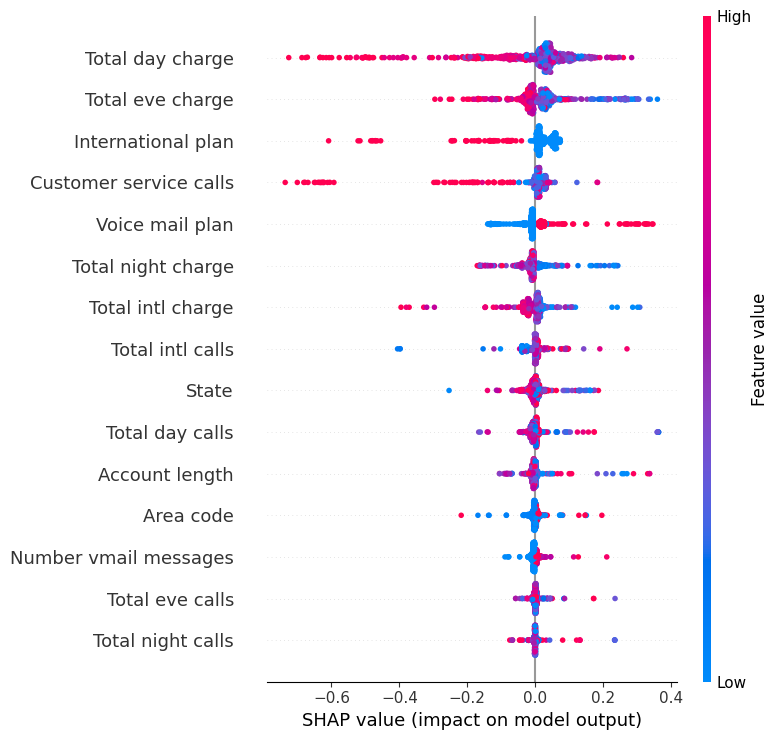

In [107]:
import shap
import numpy as np
import pandas as pd

# Initialisation de l'explainer SHAP
explainer = shap.Explainer(Final_model2, X_train_arbre)

# Calcul des valeurs SHAP pour les données de test
shap_values = explainer(X_test_arbre)

# Vérification des dimensions des valeurs SHAP et des données d'entrée
print("SHAP values shape:", shap_values.shape)  # Devrait être (667, 15, 2)
print("X_test_arbre shape:", X_test_arbre.shape)  # Devrait être (667, 15)

# Visualisation globale pour une classe spécifique
class_index = 0  # Changez entre 0 et 1 pour la classe d'intérêt

print(f"Affichage des valeurs SHAP pour la classe {class_index}")
shap_values_class = shap_values[..., class_index]  # Sélection des valeurs SHAP pour une classe
shap.summary_plot(shap_values_class, X_test_arbre)



Matrix for the model after up-sampling

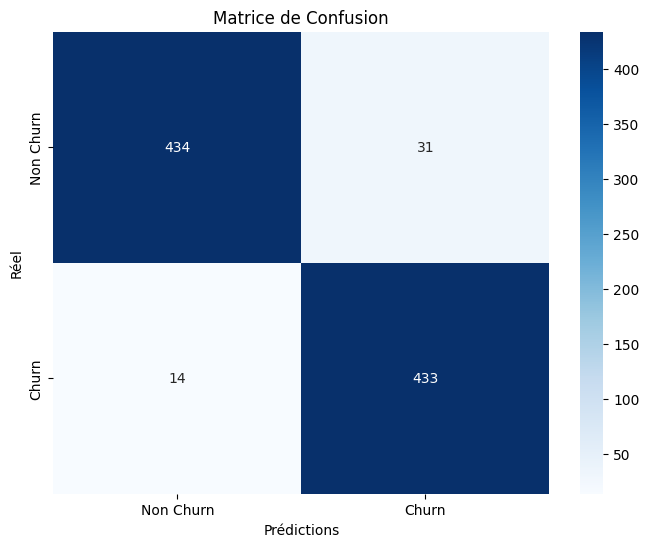

In [68]:
# Afficher la matrice de confusion
cm = confusion_matrix(y_test_arbre_bal, y_pred)
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['Non Churn', 'Churn'], yticklabels=['Non Churn', 'Churn'])
plt.title("Matrice de Confusion")
plt.xlabel("Prédictions")
plt.ylabel("Réel")
plt.show()

#Random forest

before up-sampling

In [69]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import classification_report, accuracy_score, confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.tree import export_text, plot_tree

In [70]:
# Définir les hyperparamètres à optimiser pour Random Forest
param_grid = {
    'n_estimators': [50, 100, 150],       # Nombre d'arbres dans la forêt
    'max_depth': range(1, 15),           # Profondeur maximale
    'criterion': ['gini', 'entropy'],    # Critères d'impureté
}

In [71]:
# Modèle Random Forest
model = RandomForestClassifier(random_state=42)

# Recherche de grille pour l'optimisation des hyperparamètres
grid = GridSearchCV(model, param_grid, cv=5, n_jobs=-1, verbose=1)
grid.fit(X_train_arbre, y_train_arbre)

# Meilleurs hyperparamètres
best_params3 = grid.best_params_
print("Meilleurs paramètres :", best_params3)

Fitting 5 folds for each of 84 candidates, totalling 420 fits
Meilleurs paramètres : {'criterion': 'entropy', 'max_depth': 14, 'n_estimators': 100}


In [72]:
# Modèle final avec les meilleurs hyperparamètres
Final_model3 = RandomForestClassifier(**best_params3, random_state=42)
Final_model3.fit(X_train_arbre, y_train_arbre)

RandomForestClassifier(criterion='entropy', max_depth=14, random_state=42)

In [73]:
# Scores d'entraînement et de test
train_score = Final_model3.score(X_train_arbre, y_train_arbre)
test_score = Final_model3.score(X_test_arbre, y_test_arbre)
print("Train score =", train_score)
print("Test score =", test_score)

Train score = 0.9883720930232558
Test score = 0.9355322338830585


In [74]:

# Prédictions et rapport de classification
y_pred = Final_model3.predict(X_test_arbre)
print("Classification Report:")
print(classification_report(y_test_arbre, y_pred, target_names=['Non Churn', 'Churn']))

Classification Report:
              precision    recall  f1-score   support

   Non Churn       0.95      0.98      0.96       572
       Churn       0.85      0.66      0.75        95

    accuracy                           0.94       667
   macro avg       0.90      0.82      0.85       667
weighted avg       0.93      0.94      0.93       667



after up-sampling

In [75]:
# Définir les hyperparamètres à optimiser pour Random Forest
param_grid = {
    'n_estimators': [50, 100, 150],       # Nombre d'arbres dans la forêt
    'max_depth': range(1, 15),           # Profondeur maximale
    'criterion': ['gini', 'entropy'],    # Critères d'impureté
}

In [76]:
# Modèle Random Forest
model = RandomForestClassifier(random_state=42)

# Recherche de grille pour l'optimisation des hyperparamètres
grid = GridSearchCV(model, param_grid, cv=5, n_jobs=-1, verbose=1)
grid.fit(X_train_arbre_bal, y_train_arbre_bal)

# Meilleurs hyperparamètres
best_params4 = grid.best_params_
print("Meilleurs paramètres :", best_params4)

Fitting 5 folds for each of 84 candidates, totalling 420 fits
Meilleurs paramètres : {'criterion': 'entropy', 'max_depth': 14, 'n_estimators': 150}


In [77]:
# Modèle final avec les meilleurs hyperparamètres
Final_model4 = RandomForestClassifier(**best_params4, random_state=42)
Final_model4.fit(X_train_arbre_bal, y_train_arbre_bal)

RandomForestClassifier(criterion='entropy', max_depth=14, n_estimators=150,
                       random_state=42)

In [78]:
train_score = Final_model4.score(X_train_arbre_bal, y_train_arbre_bal)
test_score = Final_model4.score(X_test_arbre_bal, y_test_arbre_bal)
print("Train score =", train_score)
print("Test score =", test_score)
# Prédictions et rapport de classification
y_pred = Final_model4.predict(X_test_arbre_bal)
print("Classification Report:")
print(classification_report(y_test_arbre_bal, y_pred, target_names=['Non Churn', 'Churn']))
joblib.dump(Final_model4, 'RandomForest.pkl')

Train score = 1.0
Test score = 0.9835526315789473
Classification Report:
              precision    recall  f1-score   support

   Non Churn       0.98      0.99      0.98       465
       Churn       0.99      0.98      0.98       447

    accuracy                           0.98       912
   macro avg       0.98      0.98      0.98       912
weighted avg       0.98      0.98      0.98       912



['RandomForest.pkl']

confusion matrix

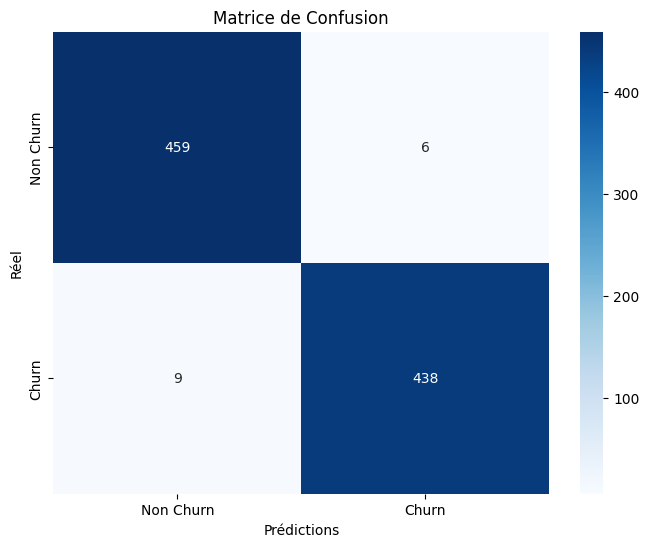

In [80]:
# Matrice de confusion
cm = confusion_matrix(y_test_arbre_bal, y_pred)
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['Non Churn', 'Churn'], yticklabels=['Non Churn', 'Churn'])
plt.title("Matrice de Confusion")
plt.xlabel("Prédictions")
plt.ylabel("Réel")
plt.show()

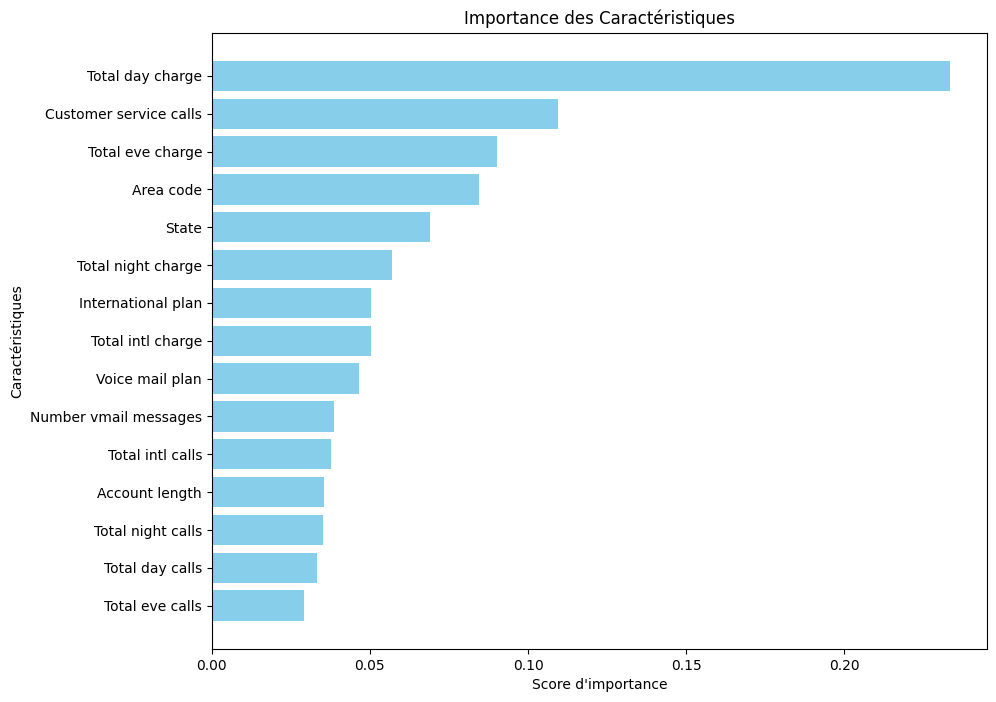

In [81]:
# Importance des caractéristiques
importances = Final_model4.feature_importances_
features = X_train_arbre_bal.columns
sorted_idx = importances.argsort()

plt.figure(figsize=(10, 8))
plt.barh(features[sorted_idx], importances[sorted_idx], color='skyblue')
plt.title("Importance des Caractéristiques")
plt.xlabel("Score d'importance")
plt.ylabel("Caractéristiques")
plt.show()

Since we don’t have the same number of variables and rows as the article, it is nearly impossible to achieve a 100% identical result. Our results show 95% accuracy for the decision tree and 98% for the random forest, which is practically the best outcome we can achieve.

In [82]:
# Prédictions du modèle
model_predictions = Final_model4.predict_proba(X_test_arbre)

# Calcul de la somme des valeurs SHAP
shap_sums = np.sum(shap_values.values, axis=1) + explainer.expected_value

# Comparez les prédictions et les sommes des valeurs SHAP
for i in range(5):  # Vérifiez quelques échantillons
    print(f"Échantillon {i}:")
    print(f"Prédiction du modèle : {model_predictions[i]}")
    print(f"Somme des SHAP values : {shap_sums[i]}")


Échantillon 0:
Prédiction du modèle : [0.91571283 0.08428717]
Somme des SHAP values : [9.99999994e-01 7.81276169e-10]
Échantillon 1:
Prédiction du modèle : [0.43299843 0.56700157]
Somme des SHAP values : [-1.57173619e-09  1.00000000e+00]
Échantillon 2:
Prédiction du modèle : [0.34589794 0.65410206]
Somme des SHAP values : [-1.86836242e-08  1.00000001e+00]
Échantillon 3:
Prédiction du modèle : [0.95621527 0.04378473]
Somme des SHAP values : [ 9.99999992e-01 -4.66696085e-10]
Échantillon 4:
Prédiction du modèle : [0.96899942 0.03100058]
Somme des SHAP values : [ 9.99999995e-01 -5.59828364e-10]


In [83]:
#pip install shap==0.39.0


In [84]:
import shap
print(shap.__version__)


0.46.0


 99%|===================| 1322/1334 [00:40<00:00]       

SHAP values shape: (667, 15, 2)
X_test_arbre shape: (667, 15)
Affichage des valeurs SHAP pour la classe 0
Shape of shap_values_class: (667, 15)


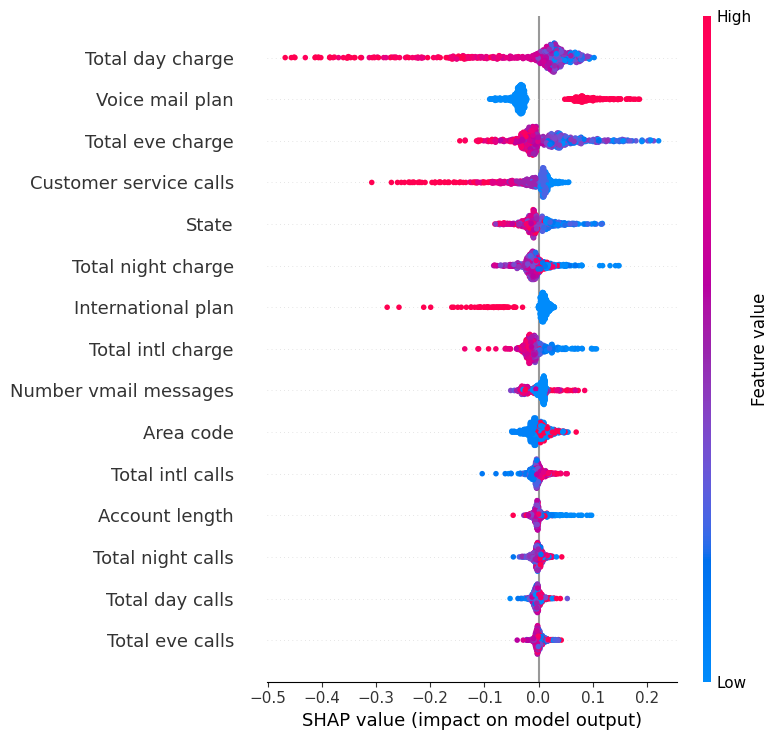

In [86]:
import shap
import numpy as np
import pandas as pd

# Initialisation de l'explainer SHAP avec contrôle d'additivité désactivé
explainer = shap.TreeExplainer(Final_model4, X_train_arbre)

# Calcul des valeurs SHAP pour les données de test
shap_values = explainer.shap_values(X_test_arbre, check_additivity=False)

# Vérification des dimensions des valeurs SHAP et des données d'entrée
print("SHAP values shape:", np.array(shap_values).shape)  # Forme: (samples, features, classes)
print("X_test_arbre shape:", X_test_arbre.shape)

# Visualisation globale pour une classe spécifique
class_index = 0  # Changez entre 0 et 1 pour la classe d'intérêt
print(f"Affichage des valeurs SHAP pour la classe {class_index}")

# Sélectionner les valeurs SHAP pour la classe spécifiée
# Pour un modèle multi-classe, les SHAP values sont de la forme (samples, features, classes)
shap_values_class = shap_values[:, :, class_index]  # Extraire les valeurs SHAP pour la classe

# Vérification des dimensions des valeurs SHAP pour la classe
print("Shape of shap_values_class:", shap_values_class.shape)

# S'assurer que la forme des valeurs SHAP correspond à celle de X_test_arbre
assert shap_values_class.shape == X_test_arbre.shape, \
    "La forme des shap_values_class doit correspondre à celle de X_test_arbre."

# Visualisation globale pour une classe
shap.summary_plot(shap_values_class, X_test_arbre)




#Logestic regression

In [87]:
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import GridSearchCV

# Définir la grille d'hyperparamètres
param_grid = {
    'C': [0.1, 1, 10, 100],       # Régularisation
    'penalty': ['l1', 'l2'],      # Type de pénalité
    'solver': ['liblinear', 'saga']  # Solveurs compatibles
}

In [88]:
# Initialiser GridSearchCV
grid_search = GridSearchCV(
    estimator=LogisticRegression(random_state=42),
    param_grid=param_grid,
    scoring='accuracy',  # Mesure à optimiser
    cv=5,                # Nombre de folds pour la validation croisée
    verbose=1,           # Afficher les détails
    n_jobs=-1            # Utiliser tous les cœurs disponibles
)

# Effectuer la recherche
grid_search.fit(X_train_lin, y_train_lin)

Fitting 5 folds for each of 16 candidates, totalling 80 fits


GridSearchCV(cv=5, estimator=LogisticRegression(random_state=42), n_jobs=-1,
             param_grid={'C': [0.1, 1, 10, 100], 'penalty': ['l1', 'l2'],
                         'solver': ['liblinear', 'saga']},
             scoring='accuracy', verbose=1)

In [89]:
print("Meilleurs hyperparamètres :", grid_search.best_params_)
print("Meilleure précision (Accuracy) :", grid_search.best_score_)

Meilleurs hyperparamètres : {'C': 0.1, 'penalty': 'l1', 'solver': 'liblinear'}
Meilleure précision (Accuracy) : 0.8653414001728608


In [90]:
best_model = grid_search.best_estimator_

In [91]:
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score

# Prédire les valeurs pour le jeu de test
y_pred = best_model.predict(X_test_lin)

# Calcul du score (Accuracy)
score = accuracy_score(y_test_lin, y_pred)
print("Accuracy Score :", score)

# Calcul de la matrice de confusion
conf_matrix = confusion_matrix(y_test_lin, y_pred)
print("Matrice de confusion :\n", conf_matrix)

# Rapport de classification
class_report = classification_report(y_test_lin, y_pred)
print("Rapport de classification :\n", class_report)

Accuracy Score : 0.8545727136431784
Matrice de confusion :
 [[557  15]
 [ 82  13]]
Rapport de classification :
               precision    recall  f1-score   support

           0       0.87      0.97      0.92       572
           1       0.46      0.14      0.21        95

    accuracy                           0.85       667
   macro avg       0.67      0.56      0.57       667
weighted avg       0.81      0.85      0.82       667



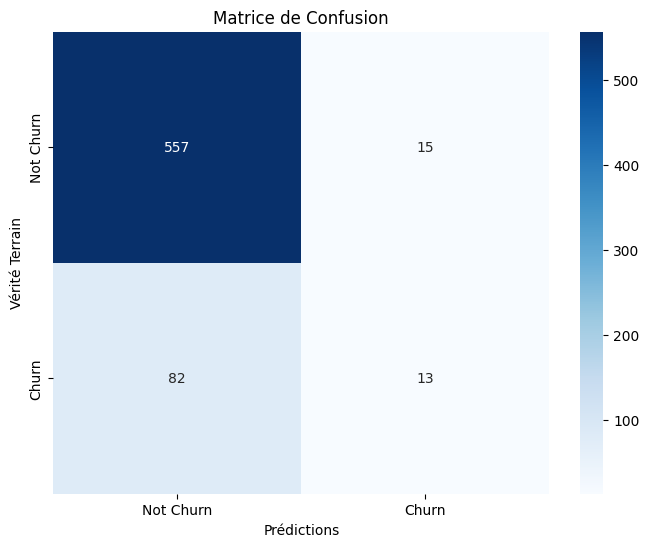

In [92]:
import seaborn as sns
import matplotlib.pyplot as plt

# Afficher la matrice de confusion avec une heatmap
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=['Not Churn', 'Churn'], yticklabels=['Not Churn', 'Churn'])
plt.xlabel('Prédictions')
plt.ylabel('Vérité Terrain')
plt.title('Matrice de Confusion')
plt.show()

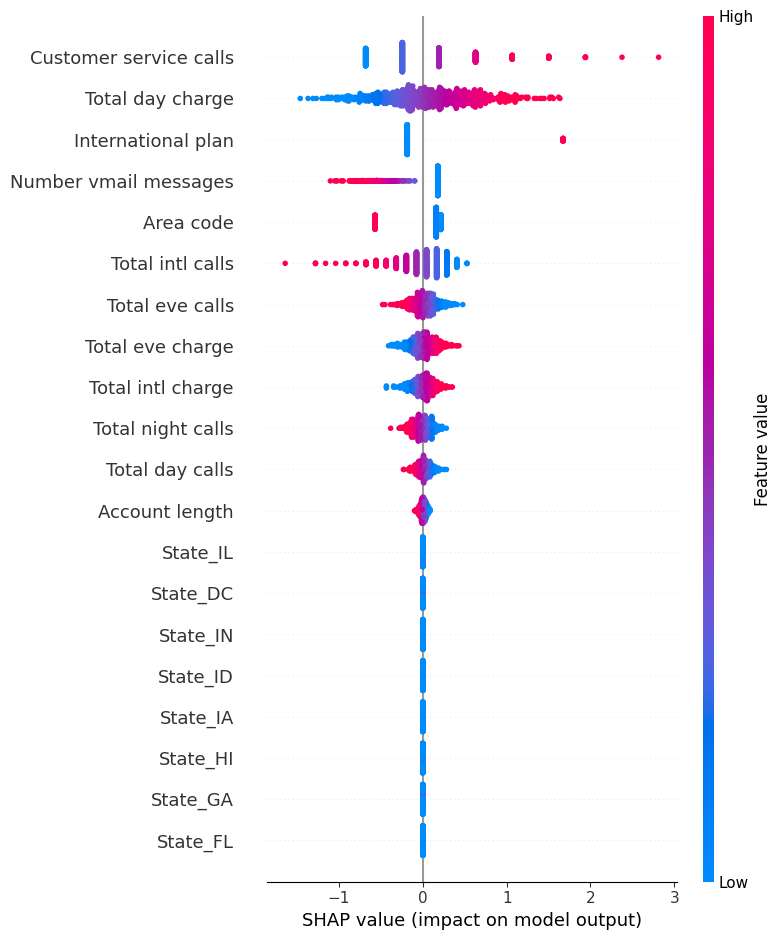

Visualisation détaillée pour l'échantillon 0


In [93]:
# Initialiser l'explainer SHAP pour la régression logistique
explainer = shap.Explainer(best_model, X_train_lin)

# Calculer les valeurs SHAP pour les données de test
shap_values = explainer(X_test_lin)

# Visualisation globale des caractéristiques importantes
shap.summary_plot(shap_values, X_test_lin)

# Visualisation détaillée pour un échantillon spécifique
sample_index = 0  # Index de l'échantillon à expliquer
print(f"Visualisation détaillée pour l'échantillon {sample_index}")

shap.force_plot(
    explainer.expected_value,  # Valeur moyenne des prédictions
    shap_values[sample_index].values,  # Valeurs SHAP pour l'échantillon
    X_test_lin.iloc[sample_index],  # Les caractéristiques de l'échantillon
    feature_names=X_test_lin.columns  # Noms des caractéristiques
)

#KNN

In [94]:
from sklearn.neighbors import KNeighborsClassifier
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score

In [95]:

# Définir les hyperparamètres à tester
param_grid = {
    'n_neighbors': [3, 5, 7, 9],
    'weights': ['uniform', 'distance'],
    'metric': ['euclidean', 'manhattan', 'minkowski']
}

# Initialisation du modèle KNN
knn = KNeighborsClassifier()

# GridSearchCV pour optimiser les hyperparamètres
grid_search_knn = GridSearchCV(
    estimator=knn,
    param_grid=param_grid,
    cv=5,                # Validation croisée à 5 plis
    scoring='accuracy',  # Utiliser la précision comme métrique
    n_jobs=-1,           # Utiliser tous les cœurs pour accélérer
    verbose=1            # Afficher la progression
)

# Ajustement du modèle sur les données d'entraînement
grid_search_knn.fit(X_train_lin, y_train_lin)

# Meilleurs hyperparamètres
print("Meilleurs paramètres:", grid_search_knn.best_params_)

# Meilleur modèle avec les hyperparamètres optimaux
best_knn_model = grid_search_knn.best_estimator_
print("Meilleur modèle :", best_knn_model)


Fitting 5 folds for each of 24 candidates, totalling 120 fits
Meilleurs paramètres: {'metric': 'manhattan', 'n_neighbors': 5, 'weights': 'uniform'}
Meilleur modèle : KNeighborsClassifier(metric='manhattan')


In [96]:
# Entraîner le modèle
best_knn_model.fit(X_train_lin, y_train_lin)
# Prédire sur le jeu de test
y_pred_knn = best_knn_model.predict(X_test_lin)

In [97]:
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score

# Calcul du score (Accuracy)
score_knn = accuracy_score(y_test_lin, y_pred_knn)
print("Accuracy Score (kNN) :", score_knn)

# Calcul de la matrice de confusion
conf_matrix_knn = confusion_matrix(y_test_lin, y_pred_knn)
print("Matrice de Confusion (kNN) :\n", conf_matrix_knn)

# Rapport de classification
class_report_knn = classification_report(y_test_lin, y_pred_knn)
print("Rapport de Classification (kNN) :\n", class_report_knn)

Accuracy Score (kNN) : 0.8620689655172413
Matrice de Confusion (kNN) :
 [[567   5]
 [ 87   8]]
Rapport de Classification (kNN) :
               precision    recall  f1-score   support

           0       0.87      0.99      0.92       572
           1       0.62      0.08      0.15        95

    accuracy                           0.86       667
   macro avg       0.74      0.54      0.54       667
weighted avg       0.83      0.86      0.81       667



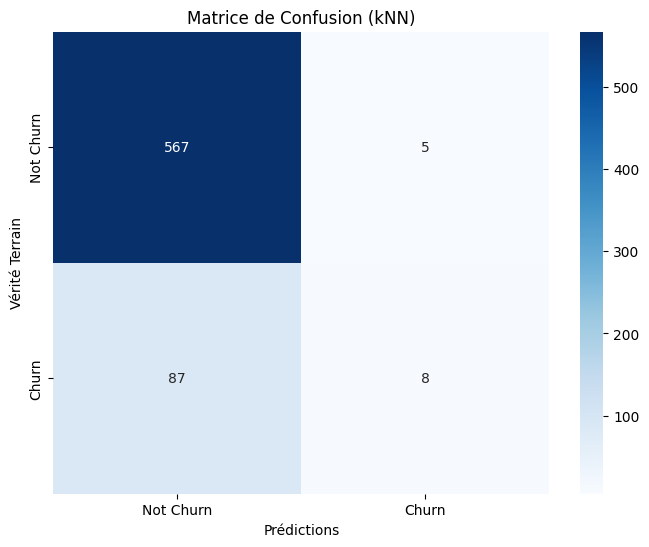

In [98]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix_knn, annot=True, fmt='d', cmap='Blues', xticklabels=['Not Churn', 'Churn'], yticklabels=['Not Churn', 'Churn'])
plt.xlabel('Prédictions')
plt.ylabel('Vérité Terrain')
plt.title('Matrice de Confusion (kNN)')
plt.show()

knn ne support pas le shap

#GBM

Fitting 5 folds for each of 56 candidates, totalling 280 fits
Meilleurs paramètres : {'learning_rate': 0.1, 'max_depth': 6, 'n_estimators': 100, 'subsample': 1.0}
Train score = 0.9992498124531133
Test score = 0.9430284857571214
Classification Report:
              precision    recall  f1-score   support

   Non Churn       0.97      0.97      0.97       572
       Churn       0.81      0.79      0.80        95

    accuracy                           0.94       667
   macro avg       0.89      0.88      0.88       667
weighted avg       0.94      0.94      0.94       667



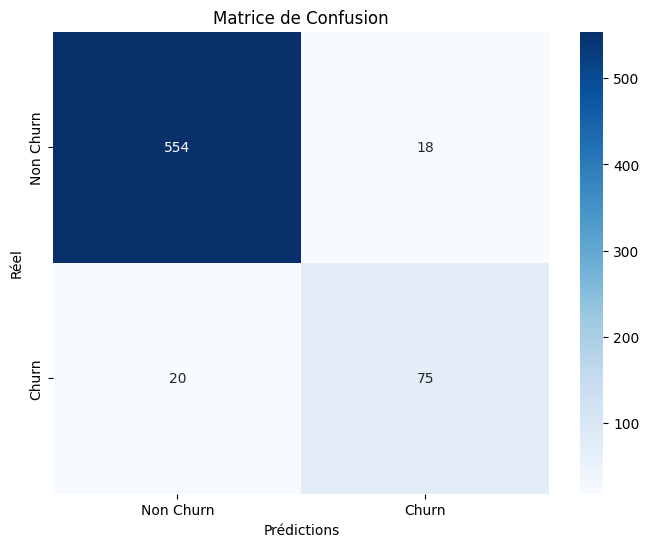

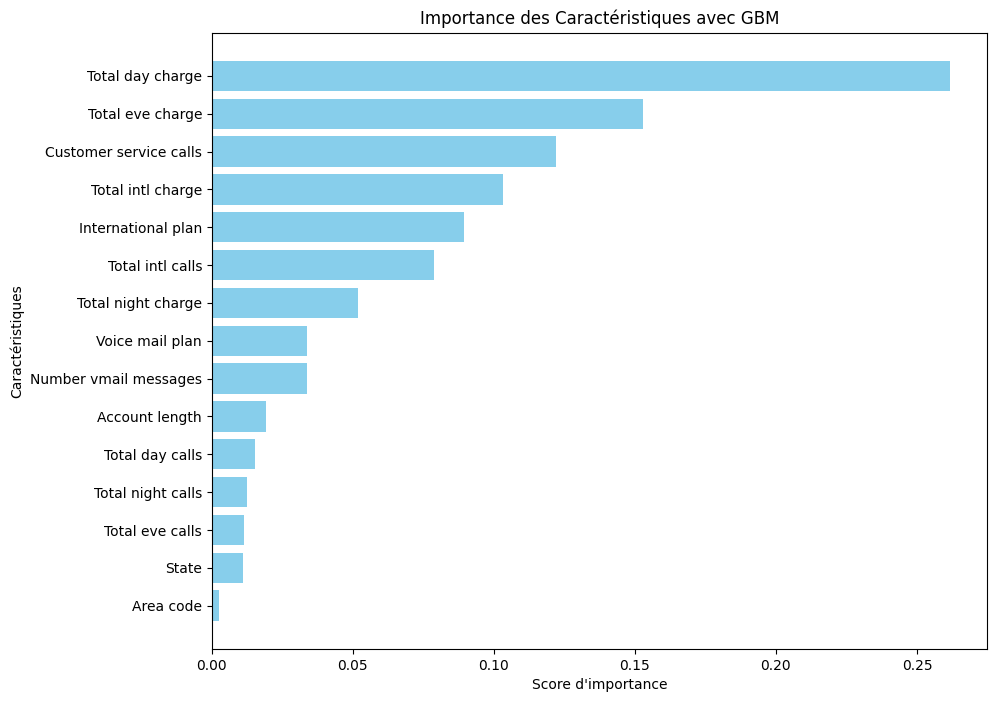

In [99]:
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

# Définir les hyperparamètres à optimiser pour GBM
param_grid = {
    'n_estimators': [50, 100],         # Nombre d'arbres
    'max_depth': range(1, 15),             # Profondeur maximale
    'learning_rate': [ 0.1],     # Taux d'apprentissage
    'subsample': [0.8, 1.0],               # Échantillonnage des données
}

# Modèle GBM
model = GradientBoostingClassifier(random_state=42)

# Recherche de grille pour l'optimisation des hyperparamètres
grid = GridSearchCV(model, param_grid, cv=5, n_jobs=-1, verbose=1)
grid.fit(X_train_arbre, y_train_arbre)

# Meilleurs hyperparamètres
best_params = grid.best_params_
print("Meilleurs paramètres :", best_params)

# Modèle final avec les meilleurs hyperparamètres
Final_model = GradientBoostingClassifier(**best_params, random_state=42)
Final_model.fit(X_train_arbre, y_train_arbre)

# Scores d'entraînement et de test
train_score = Final_model.score(X_train_arbre, y_train_arbre)
test_score = Final_model.score(X_test_arbre, y_test_arbre)
print("Train score =", train_score)
print("Test score =", test_score)

# Prédictions et rapport de classification
y_pred = Final_model.predict(X_test_arbre)
print("Classification Report:")
print(classification_report(y_test_arbre, y_pred, target_names=['Non Churn', 'Churn']))

# Matrice de confusion
cm = confusion_matrix(y_test_arbre, y_pred)
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['Non Churn', 'Churn'], yticklabels=['Non Churn', 'Churn'])
plt.title("Matrice de Confusion")
plt.xlabel("Prédictions")
plt.ylabel("Réel")
plt.show()
# Importance des caractéristiques
importances = Final_model.feature_importances_
features = X_train_arbre.columns
sorted_idx = importances.argsort()

plt.figure(figsize=(10, 8))
plt.barh(features[sorted_idx], importances[sorted_idx], color='skyblue')
plt.title("Importance des Caractéristiques avec GBM")
plt.xlabel("Score d'importance")
plt.ylabel("Caractéristiques")
plt.show()


Type de shap_values: <class 'numpy.ndarray'>
SHAP values shape: (667, 15)
X_test_arbre shape: (667, 15)
Les SHAP values sont 2D : modèle binaire ou mono-classe détecté.
Shape of shap_values_class: (667, 15)


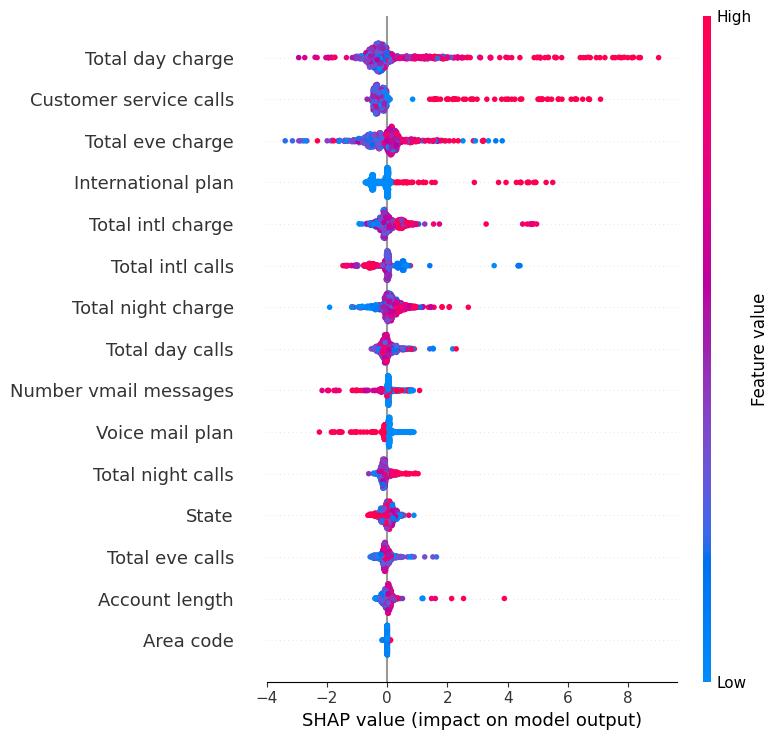

In [100]:
import shap
import numpy as np
import pandas as pd

# Initialisation de l'explainer SHAP avec contrôle d'additivité désactivé
explainer = shap.TreeExplainer(Final_model, X_train_arbre)

# Calcul des valeurs SHAP pour les données de test
shap_values = explainer.shap_values(X_test_arbre, check_additivity=False)

# Vérification des dimensions des valeurs SHAP et des données d'entrée
print("Type de shap_values:", type(shap_values))
print("SHAP values shape:", np.array(shap_values).shape)  # Forme attendue : (samples, features) ou (samples, features, classes)
print("X_test_arbre shape:", X_test_arbre.shape)

# Gestion des modèles binaires ou multi-classes
if len(np.array(shap_values).shape) == 2:
    # Cas modèle binaire ou mono-classe
    shap_values_class = shap_values
    print("Les SHAP values sont 2D : modèle binaire ou mono-classe détecté.")
else:
    # Cas modèle multi-classe
    class_index = 0  # Choisissez la classe d'intérêt (par exemple, 0 ou 1)
    shap_values_class = shap_values[:, :, class_index]
    print(f"Les SHAP values sont 3D : sélection des valeurs SHAP pour la classe {class_index}.")

# Vérification des dimensions des valeurs SHAP pour la classe
print("Shape of shap_values_class:", shap_values_class.shape)

# S'assurer que la forme des valeurs SHAP correspond à celle de X_test_arbre
assert shap_values_class.shape == X_test_arbre.shape, \
    "La forme des shap_values_class doit correspondre à celle de X_test_arbre."

# Visualisation globale des valeurs SHAP
shap.summary_plot(shap_values_class, X_test_arbre)




#SVM

In [101]:
from sklearn.svm import SVC

# Initialiser et entraîner le modèle
svm_model = SVC(kernel='rbf', probability=True, random_state=42)
svm_model.fit(X_train_arbre, y_train_arbre)

# Évaluation
y_pred_svm = svm_model.predict(X_test_arbre)
print(classification_report(y_test_arbre, y_pred_svm))

              precision    recall  f1-score   support

           0       0.86      1.00      0.92       572
           1       0.00      0.00      0.00        95

    accuracy                           0.86       667
   macro avg       0.43      0.50      0.46       667
weighted avg       0.74      0.86      0.79       667



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



In [102]:
from sklearn.svm import SVC

# Initialiser et entraîner le modèle
svm_model = SVC(kernel='rbf', probability=True, random_state=42)
svm_model.fit(X_train_lin, y_train_lin)

# Évaluation
y_pred_svm = svm_model.predict(X_test_lin)
print(classification_report(y_test_lin, y_pred_svm))

              precision    recall  f1-score   support

           0       0.86      1.00      0.92       572
           1       0.00      0.00      0.00        95

    accuracy                           0.86       667
   macro avg       0.43      0.50      0.46       667
weighted avg       0.74      0.86      0.79       667



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



#PCA et Clustering


In [104]:
pip install kneed


Columns in the DataFrame:
['State', 'Account length', 'Area code', 'International plan', 'Voice mail plan', 'Number vmail messages', 'Total day calls', 'Total day charge', 'Total eve calls', 'Total eve charge', 'Total night calls', 'Total night charge', 'Total intl calls', 'Total intl charge', 'Customer service calls', 'Churn']
Optimal number of clusters (k) found: 3


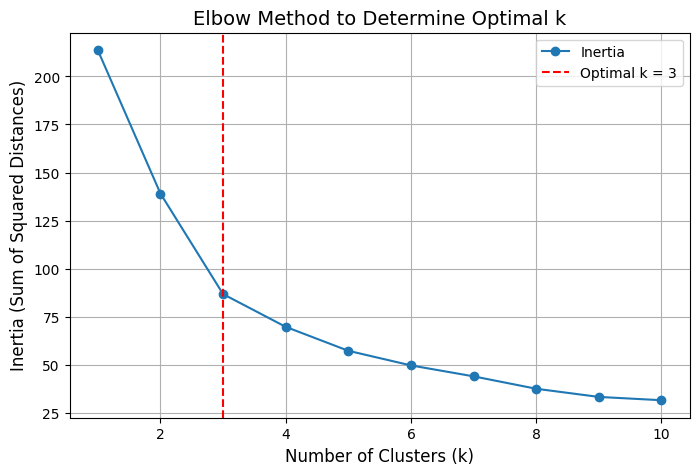

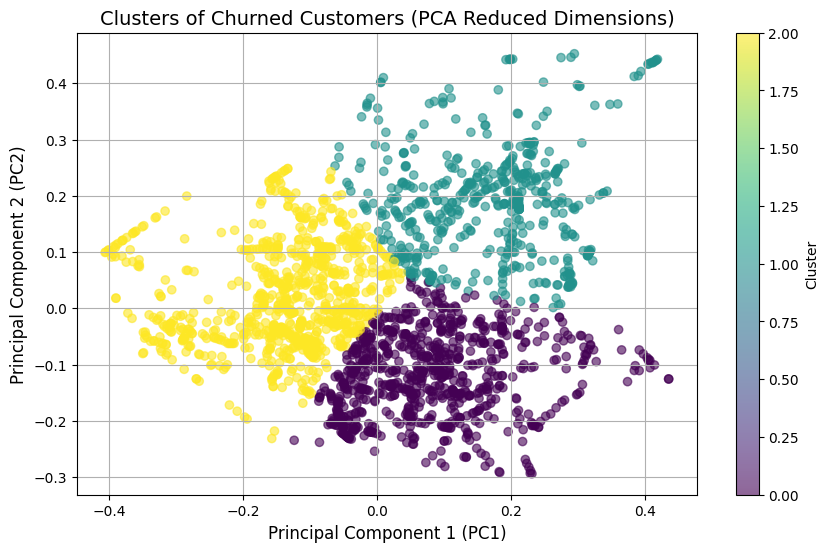

Cluster Centers (PCA Reduced Dimensions):
[[ 0.07877023 -0.12046989]
 [ 0.16587439  0.18834245]
 [-0.13525617  0.01967842]]
        PC1       PC2
0 -0.233537  0.236162
1  0.092519 -0.328992
2 -0.143200 -0.050847
3  0.230157 -0.042501
4  0.289910 -0.483379
           PC1       PC2
2280 -0.389970  0.018157
2281 -0.069381 -0.204723
2282  0.418714  0.442690
2283  0.087149  0.025405
2284 -0.062552 -0.121672


In [108]:
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from kneed import KneeLocator
import matplotlib.pyplot as plt

# Display column names for verification
print("Columns in the DataFrame:")
print( df_balanced_arbre.columns.tolist())

# Step 1: Define the numerical columns

num_columns = [
    'Account length', 'Total day calls'
    , 'Total eve calls',
    'Total night calls', 'Total intl calls',
    'Customer service calls'
]
if 'Total Monthly Charges' in df_balanced_arbre.columns:
    num_columns.append('Total Monthly Charges')  # Include if found

# Step 2: Verify that all columns exist
missing_columns = [col for col in num_columns if col not in df_balanced_arbre.columns]
if missing_columns:
    raise KeyError(f"The following columns are missing in the DataFrame: {missing_columns}")

# Step 3: Apply PCA (fit once consistently)
pca = PCA(n_components=2, random_state=42)
pca_results = pca.fit_transform(df_balanced_arbre[num_columns])
df_balanced_arbre[['PC1', 'PC2']] = pca_results

# Step 4: Elbow Method to find the best number of clusters
inertia = []
k_values = range(1, 11)  # Try k from 1 to 10
for k in k_values:
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(df_balanced_arbre[['PC1', 'PC2']])
    inertia.append(kmeans.inertia_)

# Use KneeLocator to find the elbow point
knee_locator = KneeLocator(k_values, inertia, curve='convex', direction='decreasing')
optimal_k = knee_locator.knee
print(f"Optimal number of clusters (k) found: {optimal_k}")

# Plot the Elbow Method
plt.figure(figsize=(8, 5))
plt.plot(k_values, inertia, marker='o', label='Inertia')
plt.axvline(x=optimal_k, color='red', linestyle='--', label=f'Optimal k = {optimal_k}')
plt.title('Elbow Method to Determine Optimal k', fontsize=14)
plt.xlabel('Number of Clusters (k)', fontsize=12)
plt.ylabel('Inertia (Sum of Squared Distances)', fontsize=12)
plt.legend()
plt.grid(True)
plt.show()

# Step 5: Filter rows where Churn = 1
# we need only churned people to cluster them
churn_filtered_data = df_balanced_arbre[df_balanced_arbre['Churn'] == 1].copy()

# Step 6: Run K-Means clustering with optimal k
kmeans = KMeans(n_clusters=optimal_k, random_state=42)
churn_filtered_data['Cluster'] = kmeans.fit_predict(churn_filtered_data[['PC1', 'PC2']])

# Step 7: Scatter plot to visualize the clusters
plt.figure(figsize=(10, 6))
scatter = plt.scatter(
    churn_filtered_data['PC1'],
    churn_filtered_data['PC2'],
    c=churn_filtered_data['Cluster'],
    cmap='viridis',
    alpha=0.6
)

# Add color bar and labels
plt.colorbar(scatter, label='Cluster')
plt.title('Clusters of Churned Customers (PCA Reduced Dimensions)', fontsize=14)
plt.xlabel('Principal Component 1 (PC1)', fontsize=12)
plt.ylabel('Principal Component 2 (PC2)', fontsize=12)
plt.grid(True)
plt.show()

# Print cluster centers and PCA-transformed data
print("Cluster Centers (PCA Reduced Dimensions):")
print(kmeans.cluster_centers_)
print(df_balanced_arbre[['PC1', 'PC2']].head())
print(churn_filtered_data[['PC1', 'PC2']].head())

Cluster Centers (PCA Reduced Dimensions):
         PC1       PC2
0  0.078770 -0.120470
1  0.165874  0.188342
2 -0.135256  0.019678

Feature Means by Cluster (Original Features):
          Account length  Total day calls  Total eve calls  Total night calls  \
Cluster                                                                        
0              0.546771         0.618096         0.584528           0.444447   
1              0.442307         0.543607         0.567672           0.434192   
2              0.315445         0.599052         0.567047           0.553122   

         Total intl calls  Customer service calls  
Cluster                                            
0                0.211383                0.119464  
1                0.197296                0.418852  
2                0.235124                0.123698  

Customer Counts in Each Cluster:
 Cluster
0    848
1    532
2    900
Name: count, dtype: int64

Sample Data from Each Cluster:
               State  Account le

<ipython-input-110-54a7a24f35fb>:24: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.



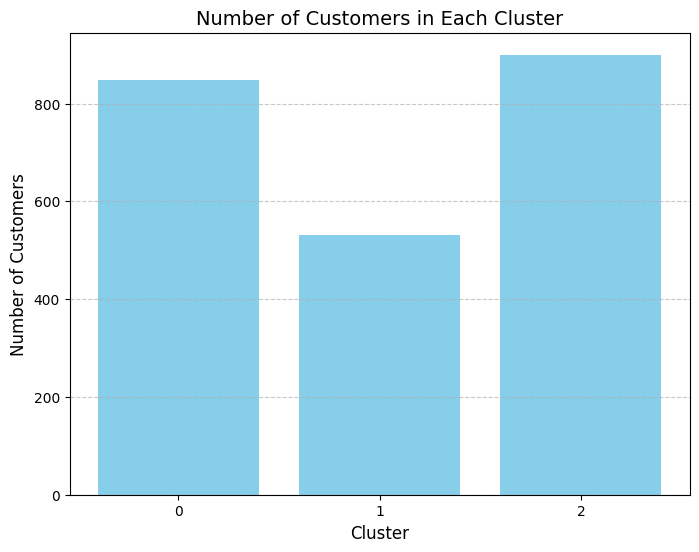

In [110]:
# Step 1: Extract cluster centers for PCA components only (PC1 and PC2)
cluster_centers = pd.DataFrame(
    kmeans.cluster_centers_,
    columns=['PC1', 'PC2']  # Only PCA components
)
print("Cluster Centers (PCA Reduced Dimensions):\n", cluster_centers)

# Step 2: Compute mean values of original features for each cluster
# Map back original features using the churn_filtered_data index
churn_filtered_data_with_features = churn_filtered_data.copy()
churn_filtered_data_with_features[num_columns] = df_balanced_arbre.loc[
    churn_filtered_data.index, num_columns
]

# Compute feature means
cluster_feature_means = churn_filtered_data_with_features.groupby('Cluster')[num_columns].mean()
print("\nFeature Means by Cluster (Original Features):\n", cluster_feature_means)

# Step 3: Count of customers in each cluster
cluster_counts = churn_filtered_data['Cluster'].value_counts().sort_index()
print("\nCustomer Counts in Each Cluster:\n", cluster_counts)

# Step 4: Sample data from each cluster
cluster_samples = churn_filtered_data_with_features.groupby('Cluster').apply(
    lambda x: x.sample(5, random_state=42)  # 5 samples per cluster
)
print("\nSample Data from Each Cluster:\n", cluster_samples)

# Step 5: Save results to CSV (optional)
cluster_centers.to_csv('cluster_centers_pca.csv', index=False)
cluster_feature_means.to_csv('cluster_feature_means.csv')
cluster_samples.to_csv('cluster_samples.csv')

# Step 6: Visualize cluster sizes
import matplotlib.pyplot as plt

plt.figure(figsize=(8, 6))
plt.bar(cluster_counts.index, cluster_counts.values, color='skyblue')
plt.title("Number of Customers in Each Cluster", fontsize=14)
plt.xlabel("Cluster", fontsize=12)
plt.ylabel("Number of Customers", fontsize=12)
plt.xticks(cluster_counts.index)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

### Analyse des Clusters

#### 1. Centres des Clusters (Dimensions Réduites par PCA)
Les centres des clusters sont définis dans les dimensions réduites par l'analyse en composantes principales (PCA), spécifiquement pour les deux premières composantes principales (PC1 et PC2).

- **Cluster 0** : Coordonnées PCA (0.078770, -0.120470)  
  → Ce cluster est légèrement situé dans une région positive de PC1 et négative de PC2.
  
- **Cluster 1** : Coordonnées PCA (0.165874, 0.188342)  
  → Ce cluster est davantage éloigné dans les régions positives de PC1 et PC2.
  
- **Cluster 2** : Coordonnées PCA (-0.135256, 0.019678)  
  → Ce cluster se situe dans une région négative de PC1 et proche de zéro pour PC2.

Cela signifie que les données de chaque cluster ont été regroupées dans des sous-espaces spécifiques des dimensions principales.

---

#### 2. Moyennes des Caractéristiques par Cluster (Features Originales)
Les moyennes des caractéristiques originales ont été calculées pour chaque cluster.

- **Cluster 0** :
  - Longueur moyenne de compte : **0.547**
  - Proportion d'appels de jour : **0.618**
  - Proportion d'appels du soir : **0.585**
  - Nombre moyen d'appels internationaux : **0.211**
  - Nombre moyen d'appels au service client : **0.119**

- **Cluster 1** :
  - Longueur moyenne de compte : **0.442**
  - Proportion d'appels de jour : **0.544**
  - Nombre moyen d'appels au service client : **0.419**  
    → Cela suggère que ces clients pourraient être plus insatisfaits ou avoir des problèmes fréquents.

- **Cluster 2** :
  - Proportion d'appels nocturnes : **0.553**
  - Nombre moyen d'appels internationaux : **0.235**
  - Nombre moyen d'appels au service client : **0.124**  
    → Cela pourrait indiquer moins de problèmes ou d'interactions.

---

#### 3. Répartition des Clients par Cluster
La distribution des clients dans chaque cluster est la suivante :

- **Cluster 0** : 848 clients (un des groupes principaux)
- **Cluster 1** : 532 clients (le plus petit groupe)
- **Cluster 2** : 900 clients (le plus grand groupe)

Cela reflète la taille relative des segments identifiés par l'algorithme.

---

#### 4. Exemples de Données par Cluster
Les données échantillonnées montrent des exemples spécifiques de clients dans chaque cluster, permettant de mieux comprendre les profils individuels.

- **Cluster 0** :  
  → Les clients ont généralement une longueur de compte modérée, peu d'appels au service client, et des appels principalement concentrés en journée.

- **Cluster 1** :  
  → Les clients montrent davantage d'appels au service client, mais une activité plus modérée sur les appels de jour.

- **Cluster 2** :  
  → Les clients passent plus d'appels la nuit et à l'international, ce qui peut indiquer un style de vie ou un usage spécifique.


#Survival analysis  COX model

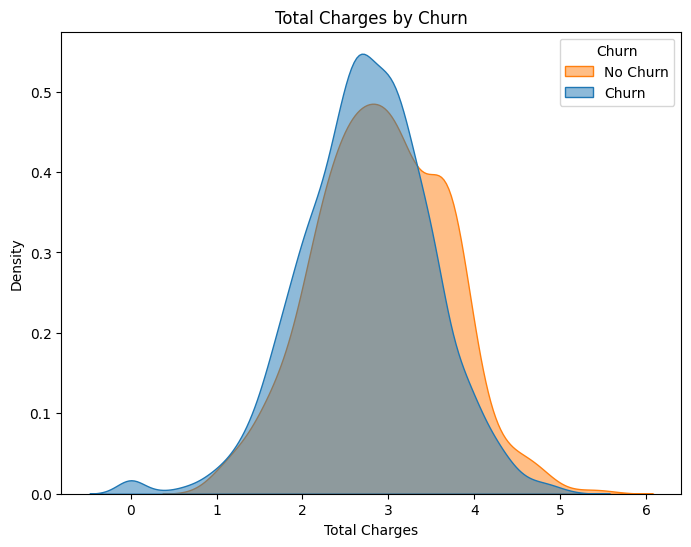

In [111]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt


# Graphe de densité
plt.figure(figsize=(8, 6))
sns.kdeplot(data=dff, x="Total intl charge", hue="Churn", fill=True, common_norm=False, alpha=0.5)
plt.title("Total Charges by Churn")
plt.xlabel("Total Charges")
plt.ylabel("Density")
plt.legend(title="Churn", labels=["No Churn", "Churn"])
plt.show()


In [112]:
pip install lifelines


  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 349.3/349.3 kB 5.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 94.5/94.5 kB 8.1 MB/s eta 0:00:00
  Created wheel for autograd-gamma: filename=autograd_gamma-0.5.0-py3-none-any.whl size=4031 sha256=fe8db393ba7ebcf88192b7e6516535210710b095eeb237f8b4fcc82449c7001e
  Stored in directory: /root/.cache/pip/wheels/25/cc/e0/ef2969164144c899fedb22b338f6703e2b9cf46eeebf254991
Successfully built autograd-gamma


In [113]:
from lifelines import CoxPHFitter

# Modèle de Cox
cph = CoxPHFitter()
cph.fit(dfcox, duration_col='Account length', event_col='Churn')

# Résultats
cph.print_summary()  # Affiche les coefficients, p-valeurs, etc.


<lifelines.CoxPHFitter: fitted with 2666 total observations, 2278 right-censored observations>
             duration col = 'Account length'
                event col = 'Churn'
      baseline estimation = breslow
   number of observations = 2666
number of events observed = 388
   partial log-likelihood = -2483.58
         time fit was run = 2024-12-15 18:17:54 UTC

---
                        coef exp(coef)  se(coef)  coef lower 95%  coef upper 95% exp(coef) lower 95% exp(coef) upper 95%
covariate                                                                                                               
State                  -0.00      1.00      0.00           -0.01            0.01                0.99                1.01
Area code               0.00      1.00      0.00           -0.00            0.00                1.00                1.00
International plan      1.19      3.29      0.11            0.97            1.41                2.64                4.12
Voice mail plan        -2.15      0.12      0.54           -3.22           -1.09                0.04                0.34
Number vmail messages   0.04      1.05      0.02            0.01            0.08                1.01                1.08
Total day calls         0.00      1.00      0.00           -0.00            0.01                1.00                1.01
Total day charge        0.05      1.05      0.01            0.04            0.06                1.04                1.07
Total eve calls         0.00      1.00      0.00           -0.00            0.01                1.00                1.01
Total eve charge        0.03      1.03      0.01            0.01            0.06                1.01                1.06
Total night calls       0.00      1.00      0.00           -0.00            0.01                1.00                1.01
Total night charge      0.05      1.06      0.02            0.01            0.10                1.01                1.10
Total intl calls       -0.09      0.92      0.02           -0.13           -0.04                0.87                0.96
Total intl charge       0.22      1.25      0.07            0.09            0.36                1.09                1.43
Customer service calls  0.30      1.35      0.03            0.24            0.36                1.27                1.43

                        cmp to     z      p  -log2(p)
covariate                                            
State                     0.00 -0.12   0.91      0.14
Area code                 0.00  0.40   0.69      0.54
International plan        0.00 10.51 <0.005     83.35
Voice mail plan           0.00 -3.95 <0.005     13.67
Number vmail messages     0.00  2.63   0.01      6.86
Total day calls           0.00  0.54   0.59      0.76
Total day charge          0.00  9.22 <0.005     64.81
Total eve calls           0.00  0.29   0.77      0.38
Total eve charge          0.00  2.88 <0.005      7.99
Total night calls         0.00  0.85   0.40      1.33
Total night charge        0.00  2.43   0.02      6.03
Total intl calls          0.00 -3.60 <0.005     11.63
Total intl charge         0.00  3.25 <0.005      9.75
Customer service calls    0.00  9.79 <0.005     72.83
---
Concordance = 0.76
Partial AIC = 4995.15
log-likelihood ratio test = 351.32 on 14 df
-log2(p) of ll-ratio test = 218.12

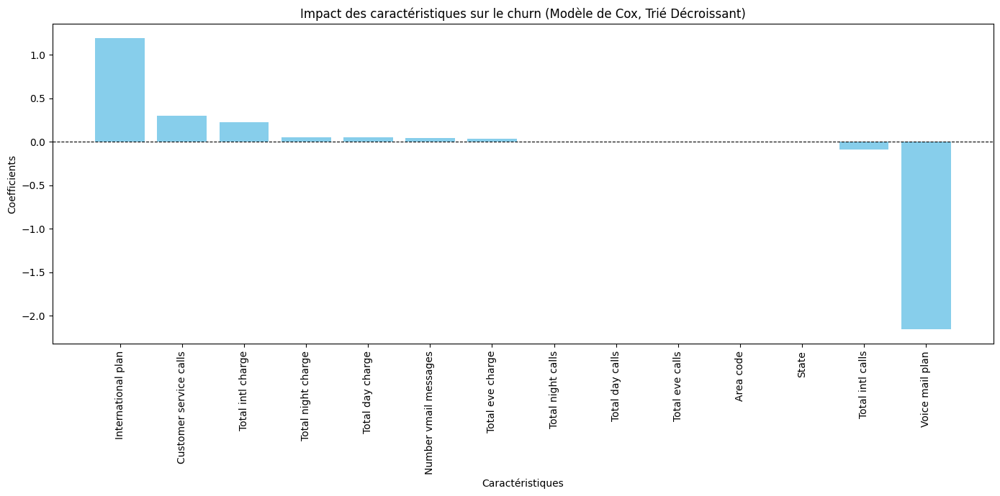

In [114]:
cox_coefficients = cph.params_
features = cox_coefficients.index  # Noms des caractéristiques

# Trier les coefficients dans l'ordre décroissant
sorted_indices = np.argsort(cox_coefficients.values)[::-1]  # Indices triés dans l'ordre décroissant
coefficients_sorted = cox_coefficients.values[sorted_indices]  # Coefficients triés
features_sorted = features[sorted_indices]  # Caractéristiques triées

# Graphe des coefficients triés dans l'ordre décroissant
plt.figure(figsize=(14, 7))
plt.bar(features_sorted, coefficients_sorted, color='skyblue')
plt.axhline(0, color='black', linewidth=0.8, linestyle='--')
plt.xticks(rotation=90, ha="center")
plt.title("Impact des caractéristiques sur le churn (Modèle de Cox, Trié Décroissant)")
plt.xlabel("Caractéristiques")
plt.ylabel("Coefficients")
plt.tight_layout()
plt.show()

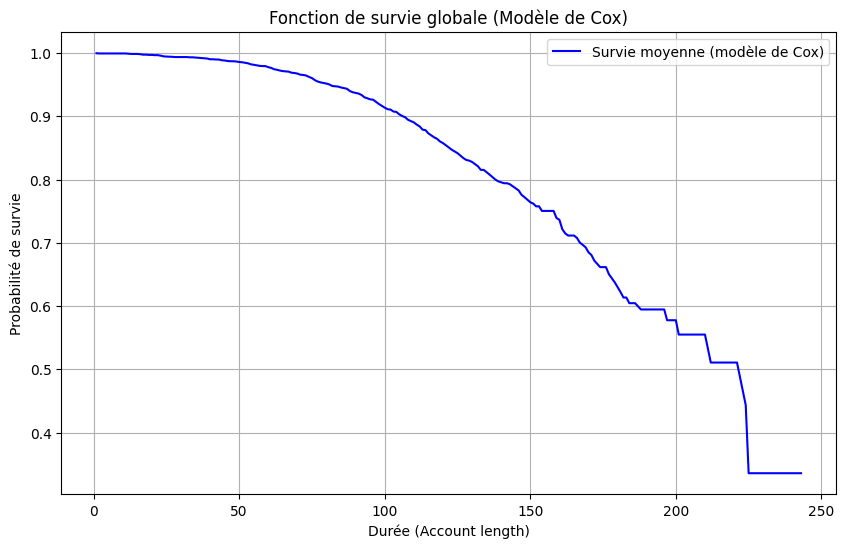

In [115]:
import pandas as pd
from lifelines import CoxPHFitter
import matplotlib.pyplot as plt


# Prédire la fonction de survie moyenne pour toutes les observations
survival_curves = cph.predict_survival_function(dfcox)

# Tracer la fonction de survie moyenne
plt.figure(figsize=(10, 6))
plt.plot(survival_curves.mean(axis=1), label="Survie moyenne (modèle de Cox)", color="blue")

plt.title("Fonction de survie globale (Modèle de Cox)")
plt.xlabel("Durée (Account length)")
plt.ylabel("Probabilité de survie")
plt.legend()
plt.grid()
plt.show()


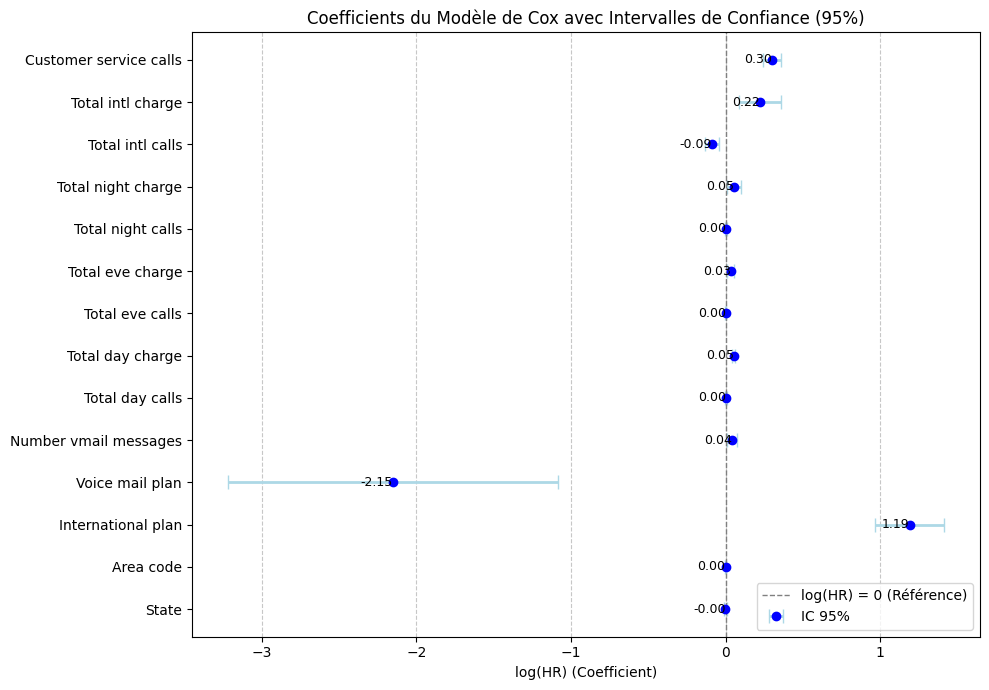

In [116]:
# Extraire les coefficients et intervalles de confiance
summary = cph.summary
coefficients = summary['coef']  # Coefficients estimés
ci_lower = summary['coef lower 95%']
ci_upper = summary['coef upper 95%']
variables = summary.index  # Noms des covariables

# Tracé
plt.figure(figsize=(10, 7))
y_pos = range(len(variables))

# Tracer les coefficients avec leurs IC
for i, var in enumerate(variables):
    plt.errorbar(coefficients[var], i, xerr=[[coefficients[var] - ci_lower[var]], [ci_upper[var] - coefficients[var]]],
                 fmt='o', color='blue', ecolor='lightblue', elinewidth=2, capsize=5, label='_nolegend_' if i else 'IC 95%')
    plt.text(coefficients[var], i, f"{coefficients[var]:.2f}", va='center', ha='right', fontsize=9, color='black')

# Ajouter une ligne verticale pour log(HR) = 0
plt.axvline(x=0, color='grey', linestyle='--', linewidth=1, label='log(HR) = 0 (Référence)')

# Ajouter des labels et le titre
plt.yticks(y_pos, variables)
plt.xlabel('log(HR) (Coefficient)')
plt.title('Coefficients du Modèle de Cox avec Intervalles de Confiance (95%)')
plt.legend(loc='lower right')
plt.grid(axis='x', linestyle='--', alpha=0.7)
plt.tight_layout()

# Afficher le graphe
plt.show()

We can clearly see that the international plan is a major cause of churn, unlike the voicemail plan. Therefore, we could create an offer or a package that includes both plans together to prevent churn. This strategy could also be applied to other plans in order to reduce churn across the board

#deploiment

In [117]:
X_train_arbre_bal

,State,Account length,Area code,International plan,Voice mail plan,Number vmail messages,Total day calls,Total day charge,Total eve calls,Total eve charge,Total night calls,Total night charge,Total intl calls,Total intl charge,Customer service calls
2413,31,0.207788,0.009300,0,0,0.000000,0.440770,0.725806,0.552830,0.694261,0.526844,0.497990,0.263551,0.656820,0.222222
1721,7,0.298701,0.068627,0,0,0.000000,0.851852,0.411596,0.496183,0.432108,0.248120,0.373308,0.111111,0.574899,0.125000
3291,37,0.603927,0.068627,0,0,0.000000,0.508407,0.697199,0.581487,0.677034,0.379449,0.496125,0.144684,0.488541,0.353487
1412,46,0.347107,0.068627,0,0,0.000000,0.762500,0.502850,0.723529,0.618570,0.127820,0.500633,0.050000,0.575926,0.111111
4412,40,0.093813,1.000000,0,0,0.000000,0.647846,0.683944,0.641176,0.749115,0.680705,0.487416,0.150000,0.436736,0.176427
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4426,32,0.677852,0.068627,1,1,0.534305,0.620623,0.585845,0.442108,0.482346,0.579377,0.453740,0.203933,0.720452,0.115197
466,11,0.735931,1.000000,0,0,0.000000,0.681481,0.531566,0.366412,0.400225,0.315789,0.678917,0.055556,0.562753,0.000000
3092,47,0.361888,0.068627,0,0,0.000000,0.525274,0.841292,0.462059,0.601625,0.761869,0.587988,0.117120,0.675169,0.228533
3772,2,0.469941,0.068627,0,0,0.000000,0.575961,0.390359,0.558017,0.506065,0.347749,0.312899,0.191135,0.471671,0.747307


In [118]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2666 entries, 0 to 2665
Data columns (total 20 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   State                   2666 non-null   object 
 1   Account length          2666 non-null   int64  
 2   Area code               2666 non-null   int64  
 3   International plan      2666 non-null   object 
 4   Voice mail plan         2666 non-null   object 
 5   Number vmail messages   2666 non-null   int64  
 6   Total day minutes       2666 non-null   float64
 7   Total day calls         2666 non-null   int64  
 8   Total day charge        2666 non-null   float64
 9   Total eve minutes       2666 non-null   float64
 10  Total eve calls         2666 non-null   int64  
 11  Total eve charge        2666 non-null   float64
 12  Total night minutes     2666 non-null   float64
 13  Total night calls       2666 non-null   int64  
 14  Total night charge      2666 non-null   

In [119]:
import pandas as pd
import joblib
import matplotlib.pyplot as plt
from lifelines import CoxPHFitter

def get_manual_input():
    data = {}
    data['State'] = input("Enter value for State: ")
    data['Account length'] = int(input("Enter value for Account length: "))
    data['Area code'] = int(input("Enter value for Area code: "))
    data['International plan'] = input("Enter value for International plan: ")
    data['Voice mail plan'] = input("Enter value for Voice mail plan: ")
    data['Number vmail messages'] = int(input("Enter value for Number vmail messages: "))
    data['Total day calls'] = int(input("Enter value for Total day calls: "))
    data['Total day charge'] = float(input("Enter value for Total day charge: "))
    data['Total eve calls'] = int(input("Enter value for Total eve calls: "))
    data['Total eve charge'] = float(input("Enter value for Total eve charge: "))
    data['Total night calls'] = int(input("Enter value for Total night calls: "))
    data['Total night charge'] = float(input("Enter value for Total night charge: "))
    data['Total intl calls'] = int(input("Enter value for Total intl calls: "))
    data['Total intl charge'] = float(input("Enter value for Total intl charge: "))
    data['Customer service calls'] = int(input("Enter value for Customer service calls: "))

    return pd.DataFrame([data])

# Test ensemble model on manual input data
def test_ensemble_model_on_input():
    input_data = get_manual_input()

    # Define continuous and categorical variables
    numerical_cols = input_data.select_dtypes(include=['number']).columns.tolist()
    categorical_cols = input_data.select_dtypes(include=['object', 'category', 'bool']).columns.tolist()

    # Mapping categorical variables (Assuming state_reference, international_plan_reference, etc., are predefined)
    state_mapping = dict(zip(state_reference['State'], state_reference['State_Code']))
    international_plan_mapping = dict(zip(international_plan_reference['International plan'], international_plan_reference['International plan_Code']))
    voice_mail_plan_mapping = dict(zip(voice_mail_plan_reference['Voice mail plan'], voice_mail_plan_reference['Voice mail plan_Code']))


    # Map categorical values to codes
    input_data['State'] = input_data['State'].map(state_mapping)
    input_data['International plan'] = input_data['International plan'].map(international_plan_mapping)
    input_data['Voice mail plan'] = input_data['Voice mail plan'].map(voice_mail_plan_mapping)

    # Handle missing values
    if input_data.isnull().values.any():
        print("Attention: Some values were not found in the reference tables.")
        print(input_data.isnull().sum())
        return

    # Standardize the numerical variables
    scaler_loaded = joblib.load('minmax_scaler.pkl')
    X_scaled = scaler_loaded.fit_transform(input_data[numerical_cols])
    input_data[numerical_cols] = X_scaled

    # Display the mapped values
    print("Mapped Values:")
    print(input_data[['State', 'International plan', 'Voice mail plan']])

    # Run ensemble models
    pred_dT = Final_model2.predict(input_data)
    pred_RF = Final_model4.predict(input_data)
    print("Prediction Decision Tree: ", pred_dT)
    print("Prediction Random Forest: ", pred_RF)



# Run the test
test_ensemble_model_on_input()


KeyboardInterrupt: Interrupted by user